In [3]:
%matplotlib inline
%load_ext memory_profiler
import sys
import os
import numpy as np
import pandas as pd
import scanpy as sc
import datetime
import scipy
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import colors

#Read config file
import configparser as config
import os
config = config.ConfigParser()
config.read('./config.ini')
data_path=config['PATHS']["wd"]
os.chdir(data_path)

sc.settings.verbosity = 2         # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=100)
sc._settings.n_jobs = 5
sc._settings.max_memory = 80 #GB

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler
-----
anndata     0.7.4
scanpy      1.5.1
sinfo       0.3.1
-----
PIL                 7.2.0
anndata             0.7.4
anyio               NA
attr                21.2.0
babel               2.9.0
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
brotli              NA
cairo               1.19.1
certifi             2020.06.20
cffi                1.14.2
chardet             3.0.4
cloudpickle         1.2.2
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
dask                2.10.1
dateutil            2.8.1
decorator           4.4.2
get_version         2.1
google              NA
h5py                2.10.0
idna                2.10
igraph              0.8.2
importlib_metadata  1.7.0
ipykernel           5.3.4
ipython_genutils    0.2.0
ipywidgets          7.5.1
jedi                0.17.2
jinja2              2.11.2
joblib              1.1.0
json5       

In [4]:
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri

dirname: Trying to get version of anndata2ri from dirname /mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages
dirname: Failed; Does not match re.compile('anndata2ri-([\\d.]+?)(?:\\.dev(\\d+))?(?:[_+-]([0-9a-zA-Z.]+))?$')
git: Trying to get version from git in directory /mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages
git: Failed; directory is not managed by git
metadata: Trying to get version for anndata2ri in dir /mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages
metadata: Succeeded


In [5]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

In [6]:
%%R
#.libPaths()
# Load all the R libraries we will be using in the notebook
library(scran)        #preprocessing
library(RColorBrewer) #visualization
library(clusterExperiment) #visualization
library(ggplot2)
library(plyr)
library(MAST)         #differential expression analysis
#library(slingshot)   #pseudotime and trajectory inference
#library(monocle)     #pseudotime and trajectory inference
#library(gam)          #finding genes that change over pseudotime


Error in library(scran) : there is no package called ‘scran’


In [7]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

# Read Data

In [8]:
results_file = data_path+'GSE130888_RAW/LPD/results_2.h5ad'  

filenames = [data_path+"GSE130888_RAW/LPD/GSM3755696/",
             data_path+"/GSE130888_RAW/LPD/GSM3755697/",
             data_path+"/GSE130888_RAW/LPD/GSM3755698/",
             data_path+"/GSE130888_RAW/LPD/GSM3755699/"]
sample_string = ["GSM3755696", "GSM3755697", "GSM3755698","GSM3755699"]
sample_id = ["0","1","2","4"]

In [9]:
#read first data
adata = sc.read_10x_mtx(filenames[0], var_names="gene_symbols", cache=True)
adata.obs["sample"] = [sample_string[0]]*adata.n_obs
adata.obs["batch"] = ["batch_0"]*adata.n_obs
adata.var_names_make_unique() 
adata

# read additional data
for index,filepath in enumerate(filenames[1:], start=1):
    print(index, filepath)
    adata_tmp = sc.read_10x_mtx(filepath, var_names="gene_symbols", cache=True)
    adata_tmp.obs["sample"] = [sample_string[index]]*adata_tmp.n_obs
    adata_tmp.obs["sample_id"] = [str(index)]*adata_tmp.n_obs
    adata_tmp.obs["batch"] = ["batch_"+str(index)]*adata_tmp.n_obs
    adata_tmp.var_names_make_unique() 
    
    #concatenate to main data
    adata = adata.concatenate(adata_tmp, batch_key='sample_id')
    adata.obs.drop(columns=['sample_id'], inplace=True)

... writing an h5ad cache file to speedup reading next time


/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


1 /mnt/dzl_bioinf/gaedckes/scRNASeq/Kidney_202001/GSE130888_RAW/LPD/GSM3755697/
... writing an h5ad cache file to speedup reading next time
2 /mnt/dzl_bioinf/gaedckes/scRNASeq/Kidney_202001/GSE130888_RAW/LPD/GSM3755698/
... writing an h5ad cache file to speedup reading next time
3 /mnt/dzl_bioinf/gaedckes/scRNASeq/Kidney_202001/GSE130888_RAW/LPD/GSM3755699/
... writing an h5ad cache file to speedup reading next time


In [10]:
#adata.obs["batch"]# = adata.obs["batch"].astype("category")
np.unique(adata.obs["batch"])

array(['batch_0', 'batch_1', 'batch_2', 'batch_3'], dtype=object)

sum(adata[: , "CX3CR1"].X > 0)

# **Preprocessing:**

## Quality controll:  
take thesholds and filter options from Si *et al.* (2019)

In [11]:
adata.obs['n_counts'] = adata.X.sum(axis=1).A1
mito_genes = adata.var_names.str.startswith('MT-') # get mt genes
adata.obs['percent_mito'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
adata.obs['n_genes'] = (adata.X > 0).sum(1).A1

#to find thresholds use:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

In [12]:
sc.pp.filter_cells(adata, min_genes=200, inplace=True) #remove cell if less then 200 genes in cell expressed
sc.pp.filter_genes(adata, min_cells=3, inplace=True)   #remove gene if less then 3 cells express the gene

#filter out cells with more then 30% mt genes:
print(adata[adata.obs.percent_mito >= 0.3, :].shape[0], " cells were removed with more then 30% mt genes")
adata = adata[adata.obs.percent_mito < 0.3, :]

filtered out 352 cells that have less than 200 genes expressed
filtered out 11853 genes that are detected in less than 3 cells
53  cells were removed with more then 30% mt genes


/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'sample' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'batch' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'feature_types' as categorical
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/seaborn/_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("

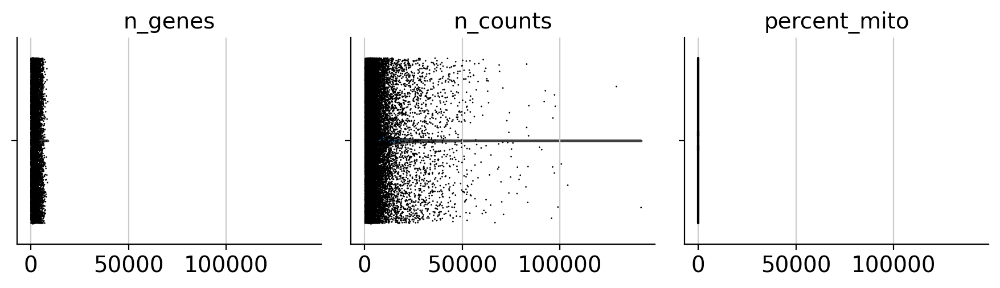

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


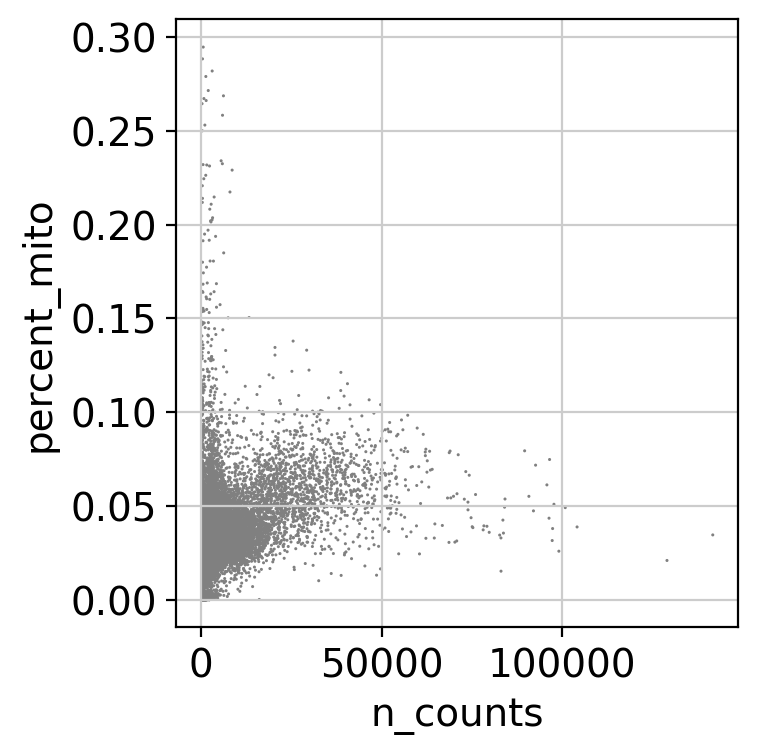

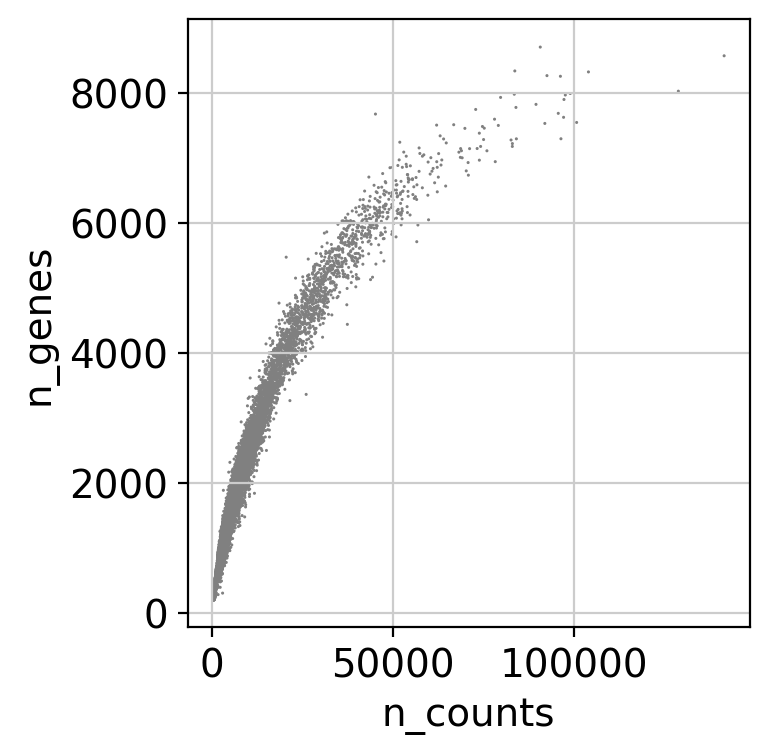

In [13]:
#after filtering:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],jitter=0.4, multi_panel=True)#, groupby="sample")
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

## **Normalization and Log**
#### using CPM 

adata[:,"CD4"].X

In [14]:
adata_pp = adata.copy() 
sc.pp.normalize_total(adata_pp, target_sum=1e6, exclude_highly_expressed=True)    # CPM, normalize per cell!!
sc.pp.log1p(adata_pp)                                                             # log
#adata.raw = adata  # save current data (normlaized and log-transformed) as raw

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['S100A8', 'S100A6', 'ITLN1', 'TMSB10', 'IGKC', 'PTMA', 'CXCL8', 'SPP1', 'CD74', 'HLA-DRA', 'ACTB', 'TMSB4X', 'TIMP1', 'FTH1', 'MALAT1', 'HSP90AA1', 'IGHG4', 'IGHA1', 'B2M', 'MT2A', 'PLCG2', 'CCL3', 'CCL3L3', 'CCL4L2', 'CST3', 'PI3', 'APOC1', 'FTL', 'IGLC2', 'IGLC3', 'MT-ND1', 'MT-ND2', 'MT-CO1', 'MT-CO2', 'MT-CO3', 'MT-CYB']


/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


    finished (0:00:00)


#### Scran

In [15]:
#Perform a clustering for scran normalization in clusters
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.louvain(adata_pp, key_added='batch', resolution=0.5)

computing PCA
    with n_comps=15
    finished (0:00:09)
computing neighbors
    using 'X_pca' with n_pcs = 15
    finished (0:00:28)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:03)


In [16]:
#Preprocess variables for scran normalization
input_groups = adata_pp.obs['batch']
data_mat = adata.X.T

In [19]:
%%R -i data_mat -i input_groups -o size_factors
size_factors = computeSumFactors(data_mat, clusters=input_groups, min.mean=0.1)


Error in computeSumFactors(data_mat, clusters = input_groups, min.mean = 0.1) : 
  could not find function "computeSumFactors"


In [18]:
#Delete adata_pp
del adata_pp

# Visualize the estimated size factors
adata.obs['size_factors'] = size_factors
sc.pl.scatter(adata, 'size_factors', 'n_counts')
sc.pl.scatter(adata, 'size_factors', 'n_genes')
sb.distplot(size_factors, bins=50, kde=False)
plt.show()

NameError: name 'size_factors' is not defined

In [21]:
#Keep the count data in a counts layer
adata.layers["counts"] = adata.X.copy()

#Normalize adata 
#adata.X /= adata.obs['size_factors'].values[:,None]
#adata.X = scipy.sparse.csr_matrix(adata.X) #convert dense back to spares
sc.pp.log1p(adata)

# Store the full data set in 'raw' as log-normalised data for statistical testing
adata.raw = adata #normalized and log-transformed with an offset of 1

## Batch correction
batch consist of:  
- cells on different chips,
- cells in different sequencing lanes  
- cells harvested at different time points
- differing environments

computing PCA
    with n_comps=50
    finished (0:00:19)
computing neighbors
    using 'X_pca' with n_pcs = 10
    finished (0:00:02)
computing UMAP
    finished (0:00:09)


/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


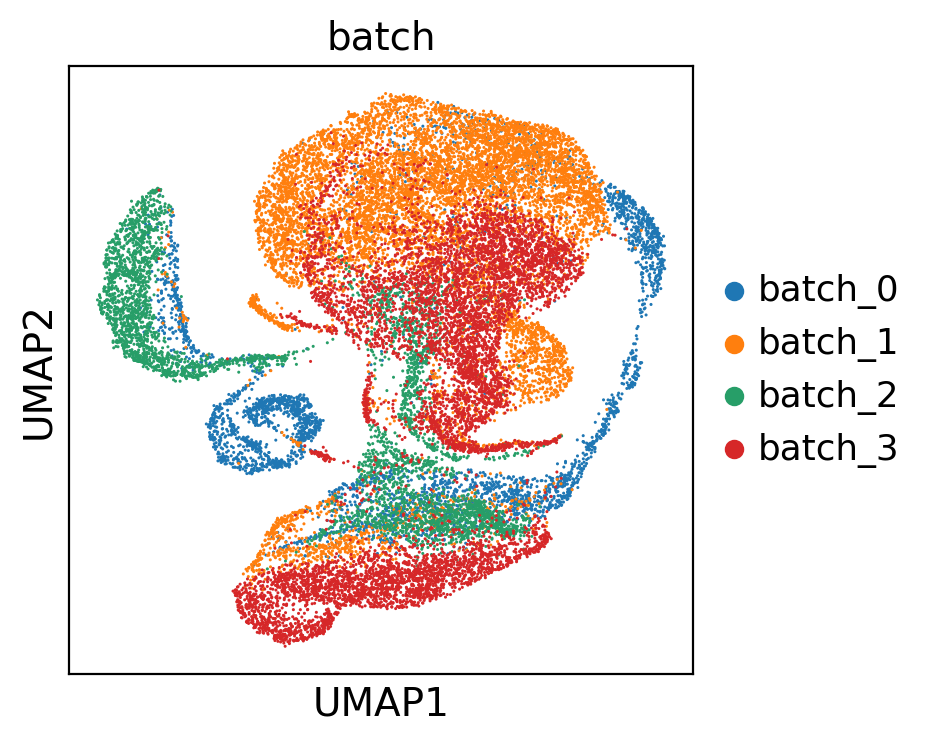

In [22]:
sc.pp.pca(adata, svd_solver='arpack')#, use_highly_variable=True)
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=10)
sc.tl.umap(adata)
sc.pl.umap(adata, color='batch', use_raw=False)

In [ ]:
#ComBat batch correction
sc.pp.combat(adata, key="batch") #ComBat batch correction can produce negative expression values
#sc.pp.regress_out(adata, "batch")

Standardizing Data across genes.

Found 4 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments



/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/scanpy/preprocessing/_combat.py:340: RuntimeWarning: divide by zero encountered in true_divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


Adjusting data



sc.pp.pca(adata, svd_solver='arpack', use_highly_variable=True)
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=10)
sc.tl.umap(adata)
sc.pl.umap(adata, color='batch')

## **Feature selection** - identify highly variable genes (HVGs)
to further reduce the dimensionality of the dataset and include only the most informative genes.
HVGs are used for clustering, trajectory inference, and dimensionality reduction/visualization, while the full data set is used for computing marker genes, differential testing, cell cycle scoring, and visualizing expression values on the data.

In [ ]:
# with set # top genes
sc.pp.highly_variable_genes(adata, n_top_genes=4000)
                            # min_mean=0.0125, max_mean=3, min_disp=0.5)                          
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))
#plot found HVGs:
sc.pl.highly_variable_genes(adata)

adata = adata[:, adata.var.highly_variable]
adata

sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])
sc.pp.scale(adata, max_value=10)

## Visualization

In [ ]:
#reduce dimensions with PCA
sc.tl.pca(adata, n_comps= 50, svd_solver='arpack', use_highly_variable=True)
sc.pl.pca_overview(adata)
#compute neighbour graph

sc.pp.neighbors(adata, n_neighbors=20)#, n_pcs=10)

In [ ]:
sc.tl.umap(adata)
sc.pl.umap(adata, color=['batch'])
#sc.pl.umap(adata, color=['CX3CL1','CX3CR1'])

computing UMAP
    finished (0:01:04)


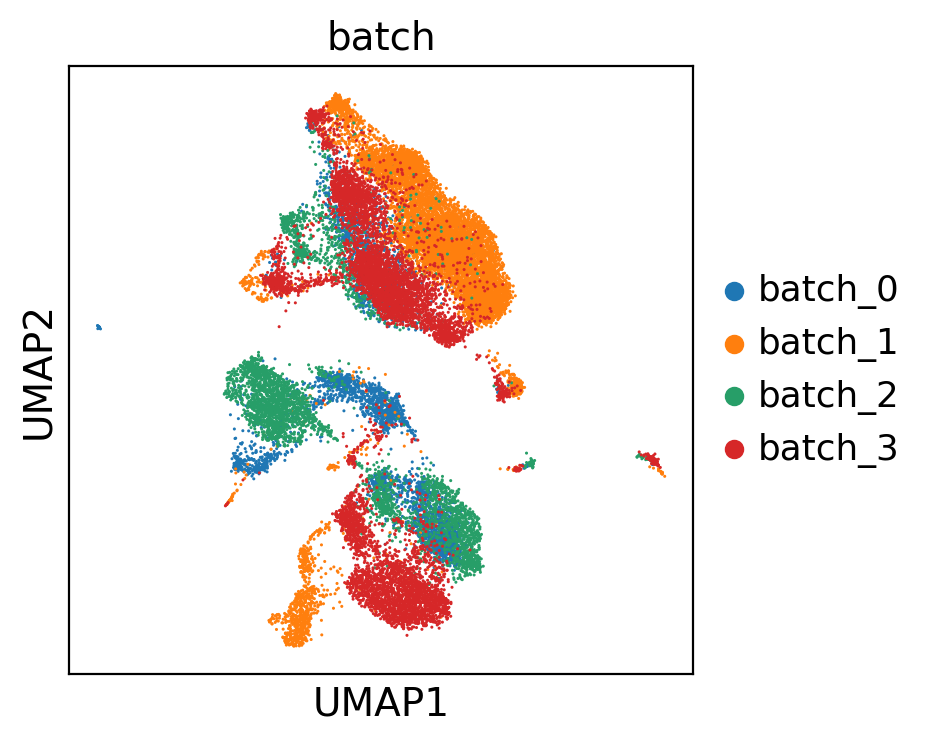

In [22]:
sc.tl.tsne(adata)
sc.pl.tsne(adata, color=['batch'])
#sc.pl.umap(adata, color=['CX3CL1','CX3CR1'])

## Cluster analysis
Louvain or Leiden

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:09)


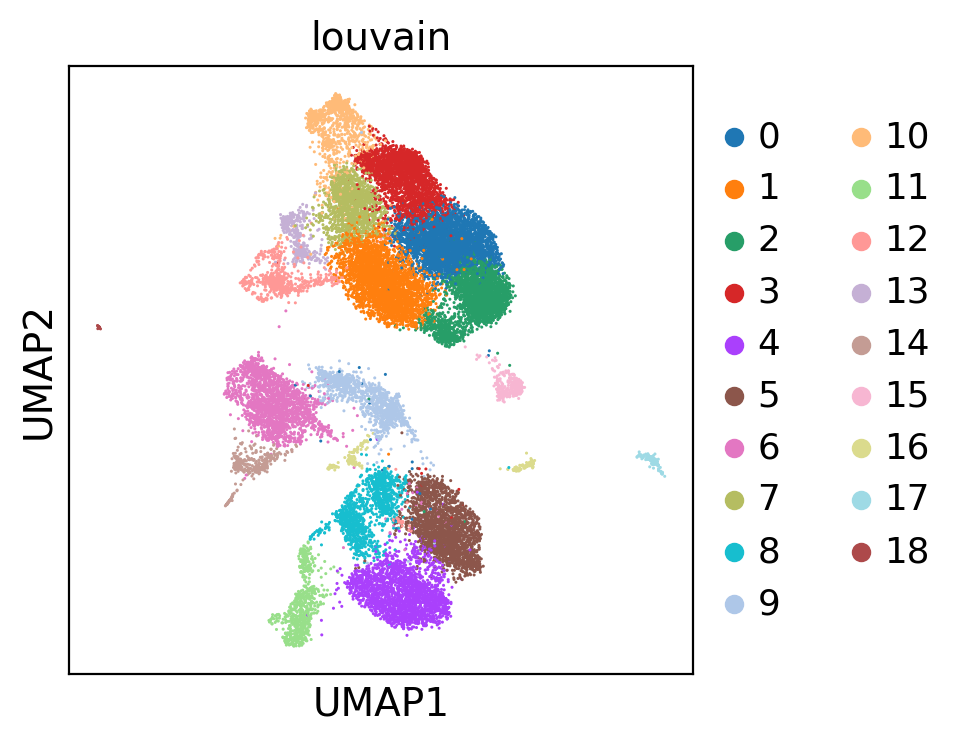

In [23]:
#clustering:
sc.tl.louvain(adata)
sc.pl.umap(adata, color=['louvain'])

### **Cluster annotation**
### find Markergenes
per Cluster to identify Cell identitied per Clusters

**Wilcox rank-sum (Mann-Whitney-U)**

ranking genes
    finished (0:01:50)
peak memory: 9972.55 MiB, increment: 1690.31 MiB


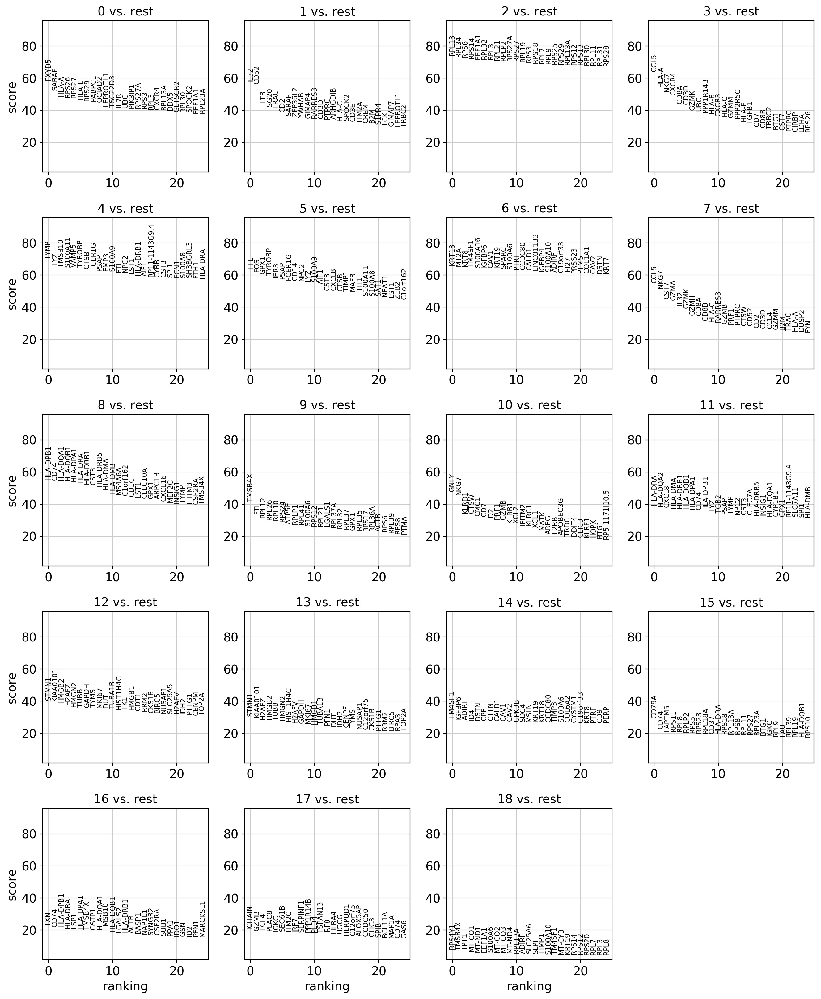

CPU times: user 1min 32s, sys: 33.3 s, total: 2min 6s
Wall time: 2min 1s


In [24]:
%%time
%memit sc.tl.rank_genes_groups(adata, groupby='louvain', method='wilcoxon') 
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=True)

In [25]:
#show top 2 ranked genes per cluster
pd.set_option('display.max_columns', 35)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,FXYD5,IL32,RPL13,CCL5,TYMP,FTL,KRT18,CCL5,HLA-DPB1,TMSB4X,GNLY,HLA-DRA,STMN1,STMN1,TM4SF1,CD79A,TXN,JCHAIN,RPS4Y1
1,SARAF,CD52,RPL34,HLA-A,LYZ,FOS,MT2A,NKG7,CD74,FTL,NKG7,HLA-DQA2,KIAA0101,KIAA0101,IGFBP6,CD74,CD74,GZMB,TMSB4X
2,HLA-A,LTB,RPS6,NKG7,TMSB10,GPX1,KRT8,CST7,HLA-DQA1,RPL12,KLRD1,CXCL8,HMGB2,H2AFZ,ADIRF,LAPTM5,HLA-DPB1,TCF4,TPT1
3,RPS26,ISG20,RPS14,CXCR4,S100A11,TYROBP,TM4SF1,GZMA,HLA-DQB1,RPL26,CTSW,HLA-DMA,H2AFZ,HMGB2,ID4,RPS11,HLA-DRA,PLAC8,MT-CO1
4,RPS27,TRAC,EEF1A1,CD8A,VAMP5,IER3,S100A16,IL32,HLA-DPA1,RPL10,CMC1,HLA-DRB1,HMGN2,TUBB,DSTN,RPL8,LSP1,IGKC,MT-ND1
5,HLA-E,CD2,RPL32,CD3D,TYROBP,PSAP,IGFBP6,GZMK,HLA-DRA,RPS24,CD7,HLA-DQB1,TUBB,HMGN2,CPE,RPLP2,HLA-DPA1,SEC61B,EEF1A1
6,RPS29,SARAF,RPL3,GZMK,CTSB,FCER1G,CAV1,GZMH,HLA-DRB1,ATP5E,ID2,HLA-DPA1,GAPDH,HIST1H4C,CTTN,RPS5,TMSB4X,ITM2C,S100A6
7,PABPC1,ZFP36L2,RPL21,UBC,FCER1G,CD14,KRT19,CD8A,CST3,RPLP1,PRF1,CD74,TYMS,H2AFV,CALD1,RPS23,GSTP1,IRF7,MT-CO2
8,OCIAD2,YWHAB,RPLP2,PPP1R14B,PSAP,NPC2,SPARC,CD8B,HLA-DRB5,RPL41,GZMB,HLA-DPB1,MKI67,GAPDH,CAV1,RPL18A,HLA-DQA1,SERPINF1,MT-CO3
9,LEPROTL1,GIMAP4,RPS27A,HLA-B,EMP3,LYZ,S100A6,HLA-C,HLA-DMA,S100A6,KLRB1,LYZ,DUT,MKI67,CAV2,CD37,TMSB10,PPP1R14B,MT-ND4


In [26]:
#list of markergenes 
marker_genes=["CD3D","CD3E","NKG7", # t
              "KRT5","UPK3B","PDPN", # mesothelia
              "CD14", "S100A8",      # mononucl
              "PDGFRB", "ACTA2",     # myrofibroblast
              "MMP2", "SFRP2",       # firbroblast
              "PECAM1", "VWF",       # endothelia
              "MS4A1"]               # B  "IGHD", 
marker_genes_dict={"T-Cell":["CD3D","CD3E","NKG7"], # t
                  "Mesothelial":["KRT5","UPK3B","PDPN"], # mesothelia
                  "Mononuclear":["CD14", "S100A8"],      # mononucl
                  "Myofibroblast":["PDGFRB", "ACTA2"],     # myrofibroblast
                  "Fibroblast":["MMP2", "SFRP2"],       # firbroblast
                  "Endothelial":["PECAM1", "VWF"],       # endothelia
                  "B-Cell":["MS4A1"]}      # B  "IGHD", 

adata = sc.read(results_file)
adata

### see which cluster has how many markers in ranked genes:

In [27]:
cell_annotation = sc.tl.marker_gene_overlap(adata, marker_genes_dict)
cell_annotation

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
T-Cell,2.0,2.0,0.0,3.0,0.0,0.0,0.0,3.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Mesothelial,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
Mononuclear,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Myofibroblast,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Fibroblast,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Endothelial,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B-Cell,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


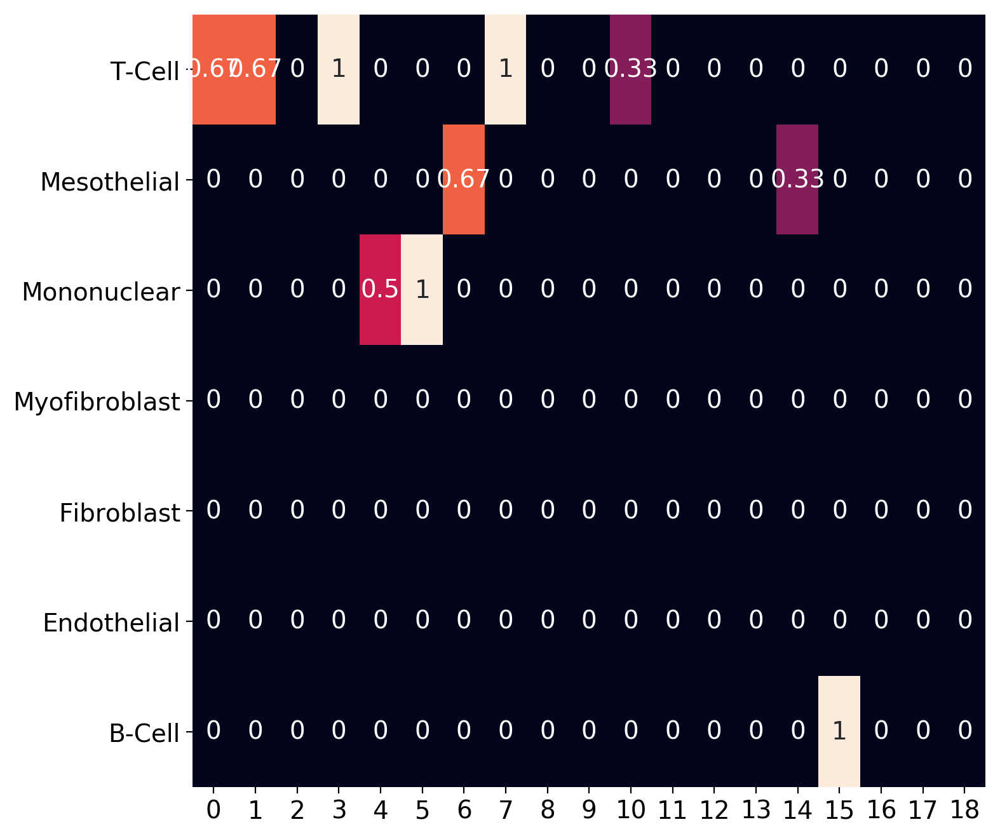

In [28]:
cell_annotation_norm = sc.tl.marker_gene_overlap(adata, marker_genes_dict, normalize='reference')
fig, ax = plt.subplots(figsize=(8,8))
sb.heatmap(cell_annotation_norm, cbar=False, annot=True)

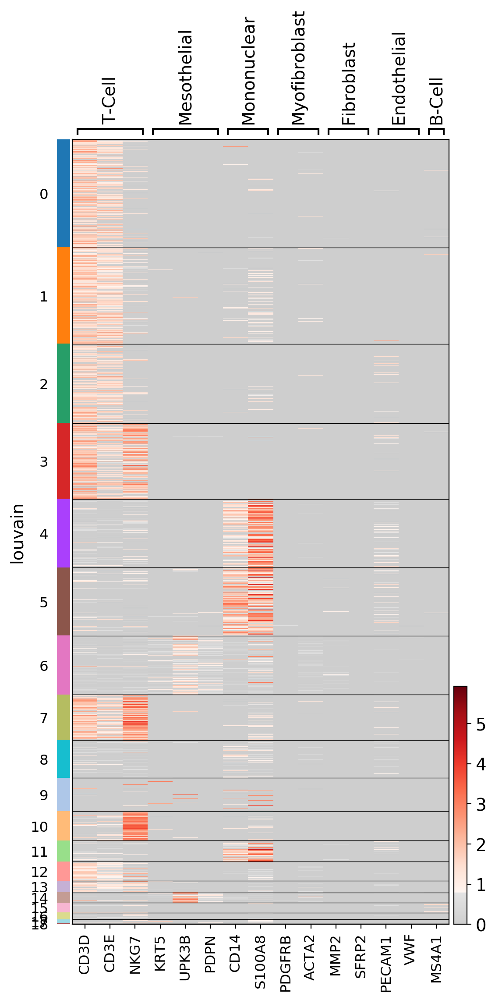

In [29]:
ax = sc.pl.heatmap(adata, marker_genes_dict, groupby='louvain', show_gene_labels=True,
                   cmap=mymap, figsize=(6,12))
                #    swap_axes=False)

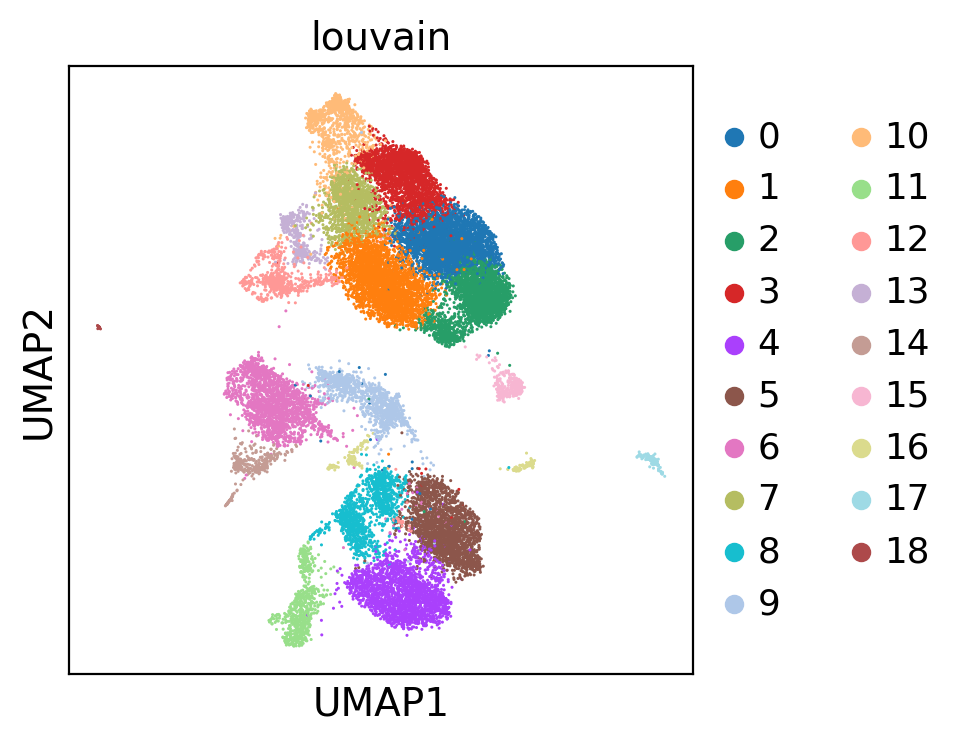

In [30]:
#visualize clusters:
sc.pl.umap(adata, color=['louvain'])

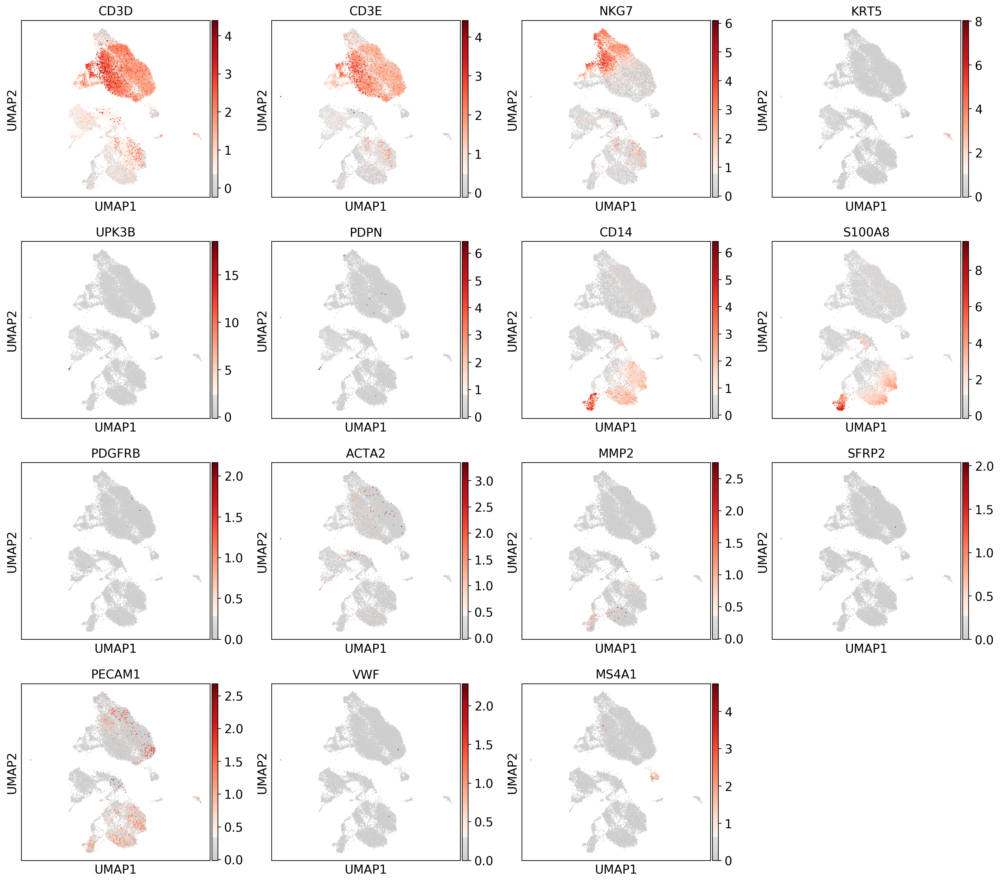

In [31]:
#color by marker
sc.pl.umap(adata, color=marker_genes, use_raw=False, color_map=mymap)

sc.pl.violin(adata, groupby='louvain', keys="PECAM1", use_raw=False)

### rename clusters with cell identities

In [32]:
#Categories to rename
adata.obs['louvain'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18'],
      dtype='object')

**rename clusters based on cell_annotation_norm and heatmap**

In [33]:
adata.rename_categories('louvain', ['T_1', 'T_2', 'U2', 'T_3', 'Mono_1', 'Mono_2', 'Meso_1', 'T_4',
                                    'U8', 'U9', 'T_5', 'U11', 'U12', 'U13', 'Meso_2', 'B',
                                    'U16', 'U17', 'U18'])
adata.obs['louvain'].value_counts()

T_1       3430
T_2       3048
U2        2509
T_3       2398
Mono_1    2175
Mono_2    2155
Meso_1    1860
T_4       1440
U8        1195
U9        1055
T_5        935
U11        658
U12        612
U13        369
Meso_2     322
B          315
U16        212
U17        135
U18         24
Name: louvain, dtype: int64

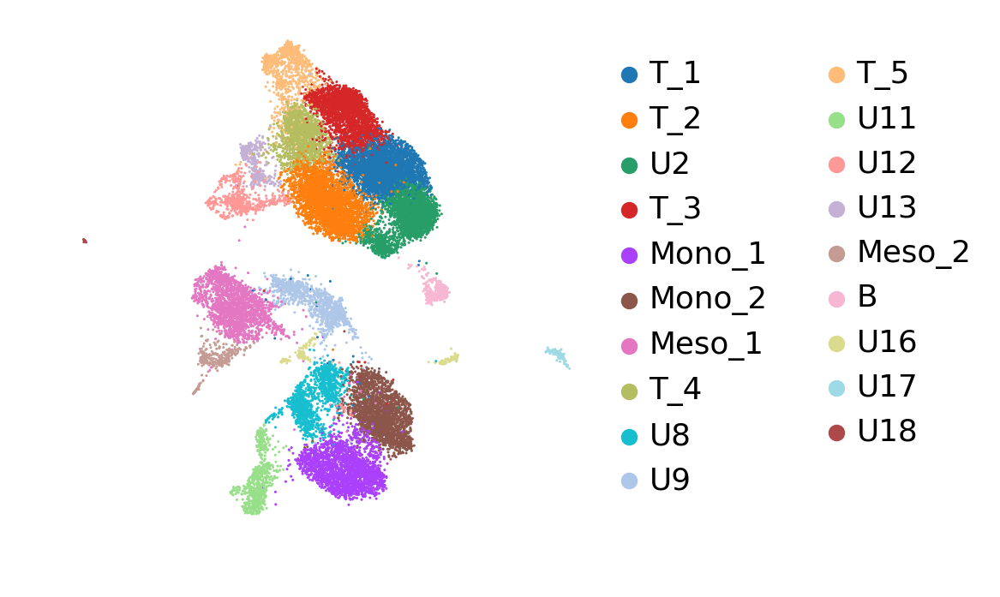

In [34]:
#sc.pl.umap(adata, color='louvain', legend_loc='on data', title='', frameon=False)
sc.pl.umap(adata, color='louvain', title='', frameon=False)

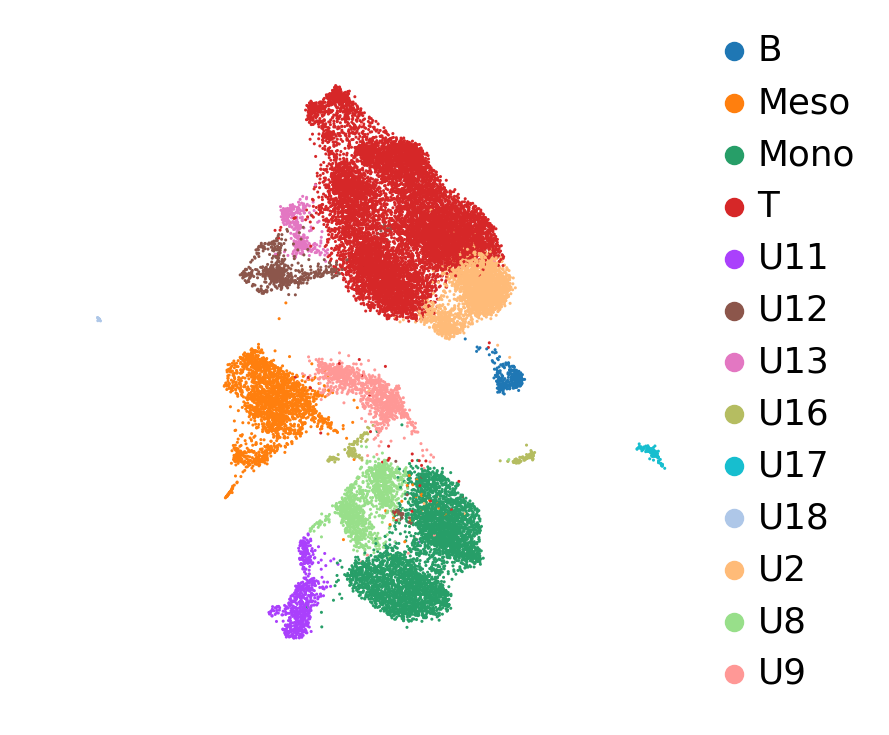

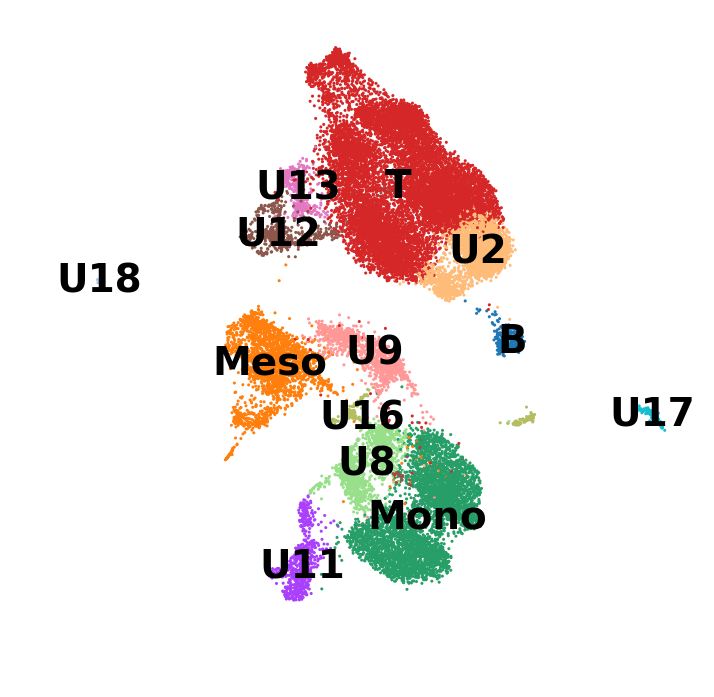

In [35]:
old_to_new = dict(T_1="T", T_2="T", U2="U2", T_3="T", Mono_1="Mono",
                  Mono_2="Mono", Meso_1="Meso", T_4="T", U8="U8", U9="U9",
                  T_5="T", U11="U11", U12="U12", U13="U13", Meso_2="Meso", 
                  B="B",U16="U16", U17="U17", U18="U18")

adata.obs['new_clusters'] = (adata.obs['louvain'].map(old_to_new).astype('category'))
sc.pl.umap(adata, color='new_clusters', title='', frameon=False)
sc.pl.umap(adata, color='new_clusters', title='',  legend_loc='on data', frameon=False)

U2 is also meso? MSLN 

adata.write(results_file)
adata = sc.read(results_file)

In [36]:
print("#Cells: ",adata.shape[0])
print("#T-Cells: ",adata[adata.obs["new_clusters"]=="T"].shape[0], "(",adata[adata.obs["new_clusters"]=="T"].shape[0]/adata.shape[0]*100,"%)")
print("#Mesothelial-Cells: ",adata[adata.obs["new_clusters"]=="Meso"].shape[0], " (",adata[adata.obs["new_clusters"]=="Meso"].shape[0]/adata.shape[0]*100,"%)")
print("#B-Cells: ",adata[adata.obs["new_clusters"]=="B"].shape[0], " (",adata[adata.obs["new_clusters"]=="B"].shape[0]/adata.shape[0]*100,"%)")
print("#Myofibroblast-Cells: ",adata[adata.obs["new_clusters"]=="Myo"].shape[0], " (",adata[adata.obs["new_clusters"]=="Myo"].shape[0]/adata.shape[0]*100,"%)")
print("#Endothelial-Cells: ",adata[adata.obs["new_clusters"]=="Endo"].shape[0], " (",adata[adata.obs["new_clusters"]=="Endo"].shape[0]/adata.shape[0]*100,"%)")
print("#Mononuclear-Cells: ",adata[adata.obs["new_clusters"]=="Mono"].shape[0], " (",adata[adata.obs["new_clusters"]=="Mono"].shape[0]/adata.shape[0]*100,"%)")
print("#Fibrobalst-Cells: ",adata[adata.obs["new_clusters"]=="Fibro"].shape[0], " (",adata[adata.obs["new_clusters"]=="Fibro"].shape[0]/adata.shape[0]*100,"%)")
#print("#Unknown Cells: ",adata[adata.obs["new_clusters"]== " "].shape[0])

#Cells:  24847
#T-Cells:  11251 ( 45.28112045719806 %)
#Mesothelial-Cells:  2182  ( 8.781744274962772 %)
#B-Cells:  315  ( 1.2677586831408219 %)
#Myofibroblast-Cells:  0  ( 0.0 %)
#Endothelial-Cells:  0  ( 0.0 %)
#Mononuclear-Cells:  4330  ( 17.426651104761138 %)
#Fibrobalst-Cells:  0  ( 0.0 %)


In [37]:
nr_batch=len(np.unique(adata.obs["batch"]))
print("normalized for number of samples:")
print("#Cells: ",adata.shape[0]/nr_batch)
print("#T-Cells: ",adata[adata.obs["new_clusters"]=="T"].shape[0]/nr_batch,
      "(",(adata[adata.obs["new_clusters"]=="T"].shape[0])/(adata.shape[0])*100,"%)")
print("#Mesothelial-Cells: ",adata[adata.obs["new_clusters"]=="Meso"].shape[0]/nr_batch,
      " (",(adata[adata.obs["new_clusters"]=="Meso"].shape[0])/(adata.shape[0])*100,"%)")
print("#B-Cells: ",adata[adata.obs["new_clusters"]=="B"].shape[0]/nr_batch, 
      " (",(adata[adata.obs["new_clusters"]=="B"].shape[0])/(adata.shape[0])*100,"%)")
print("#Myofibroblast-Cells: ",adata[adata.obs["new_clusters"]=="Myo"].shape[0]/nr_batch,
      " (",adata[adata.obs["new_clusters"]=="Myo"].shape[0]/(adata.shape[0])*100,"%)")
print("#Endothelial-Cells: ",adata[adata.obs["new_clusters"]=="Endo"].shape[0]/nr_batch, 
      " (",adata[adata.obs["new_clusters"]=="Endo"].shape[0]/(adata.shape[0])*100,"%)")
print("#Mononuclear-Cells: ",adata[adata.obs["new_clusters"]=="Mono"].shape[0]/nr_batch,
      " (",adata[adata.obs["new_clusters"]=="Mono"].shape[0]/(adata.shape[0])*100,"%)")
print("#Fibrobalst-Cells: ",adata[adata.obs["new_clusters"]=="Fibro"].shape[0]/nr_batch,
      " (",adata[adata.obs["new_clusters"]=="Fibro"].shape[0]/(adata.shape[0])*100,"%)")
#print("#Unknown Cells: ",adata[adata.obs["new_clusters"]== " "].shape[0])

normalized for number of samples:
#Cells:  6211.75
#T-Cells:  2812.75 ( 45.28112045719806 %)
#Mesothelial-Cells:  545.5  ( 8.781744274962772 %)
#B-Cells:  78.75  ( 1.2677586831408219 %)
#Myofibroblast-Cells:  0.0  ( 0.0 %)
#Endothelial-Cells:  0.0  ( 0.0 %)
#Mononuclear-Cells:  1082.5  ( 17.426651104761138 %)
#Fibrobalst-Cells:  0.0  ( 0.0 %)


## subclustering T-cell:

In [38]:
sc.tl.louvain(adata, restrict_to=('new_clusters', ['T']), resolution=0.5,
              key_added='louvain_T_sub')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:03)


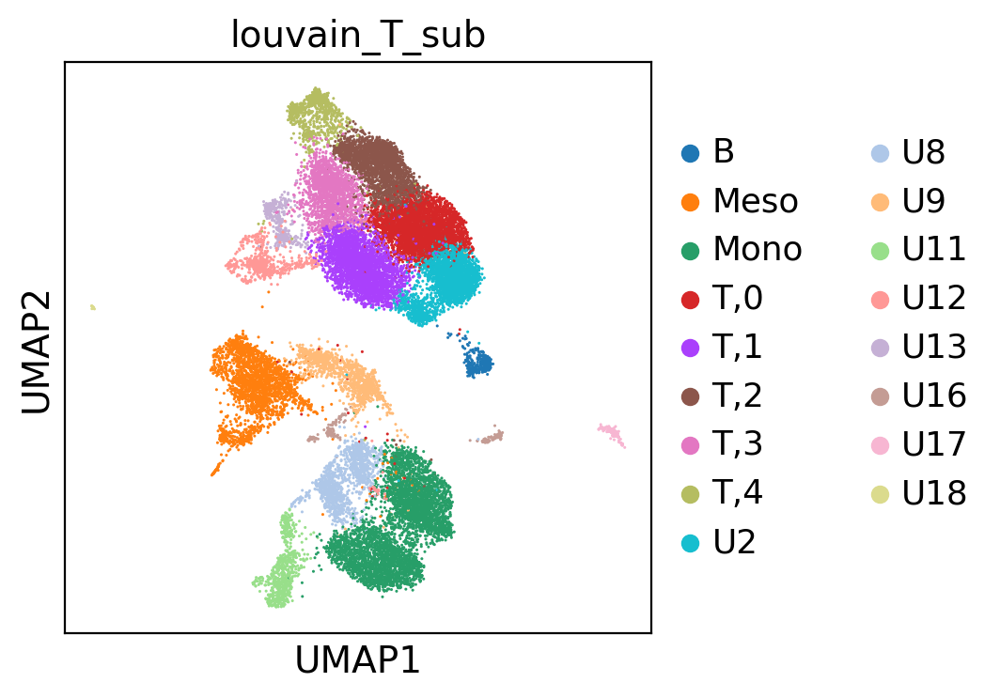

In [39]:
#Show the new clustering:
if 'louvain_T_sub_colors' in adata.uns:
    del adata.uns['louvain_T_sub_colors']

sc.pl.umap(adata, color='louvain_T_sub')

ax = sc.pl.heatmap(adata[adata.obs["new_clusters"]=="T"], marker_genes_T["T-cells"], groupby="louvain_T_sub", 
                   show_gene_labels=True, figsize =(8,12), cmap=mymap)     

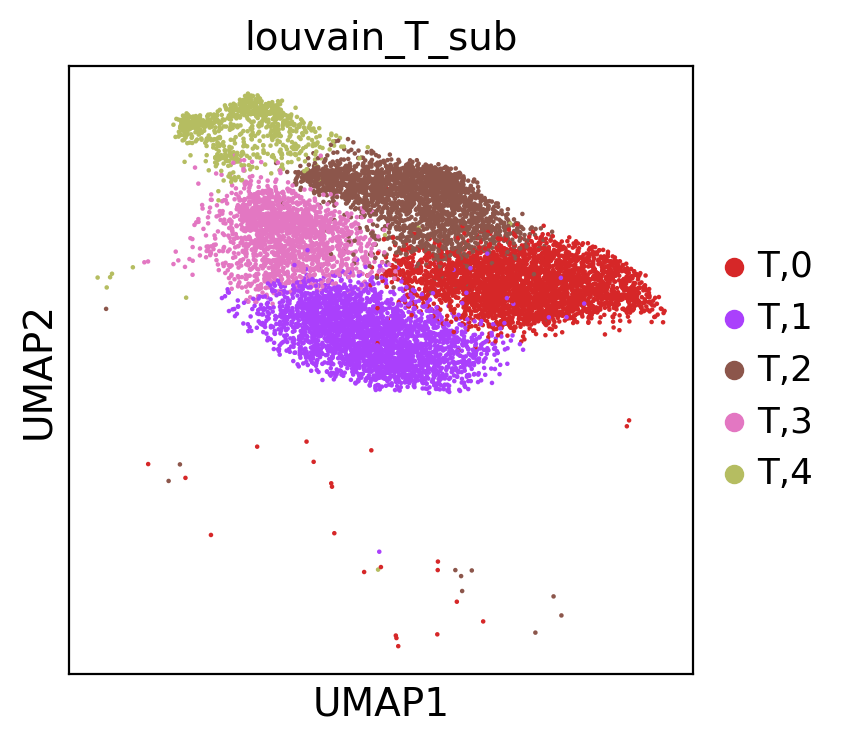

In [40]:
sc.pl.umap(adata[adata.obs["new_clusters"]=="T"], color='louvain_T_sub')

In [41]:
#Get the new marker genes
sc.tl.rank_genes_groups(adata, groupby='louvain_T_sub', key_added='rank_genes_T_sub')

ranking genes
    finished (0:00:35)


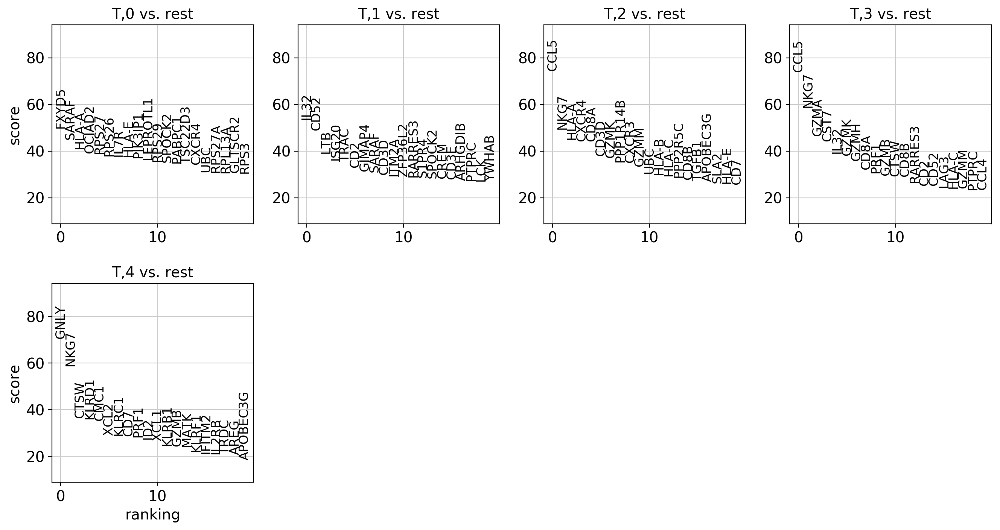

In [42]:
#Plot the new marker genes
T_clusters = [i for i in np.unique(adata.obs["louvain_T_sub"]) if "T" in i] 
sc.pl.rank_genes_groups(adata, key='rank_genes_T_sub', groups=T_clusters, fontsize=12)

**test if subclusters are based on real differences or only noise**:  
plot rank_genes 90-100

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


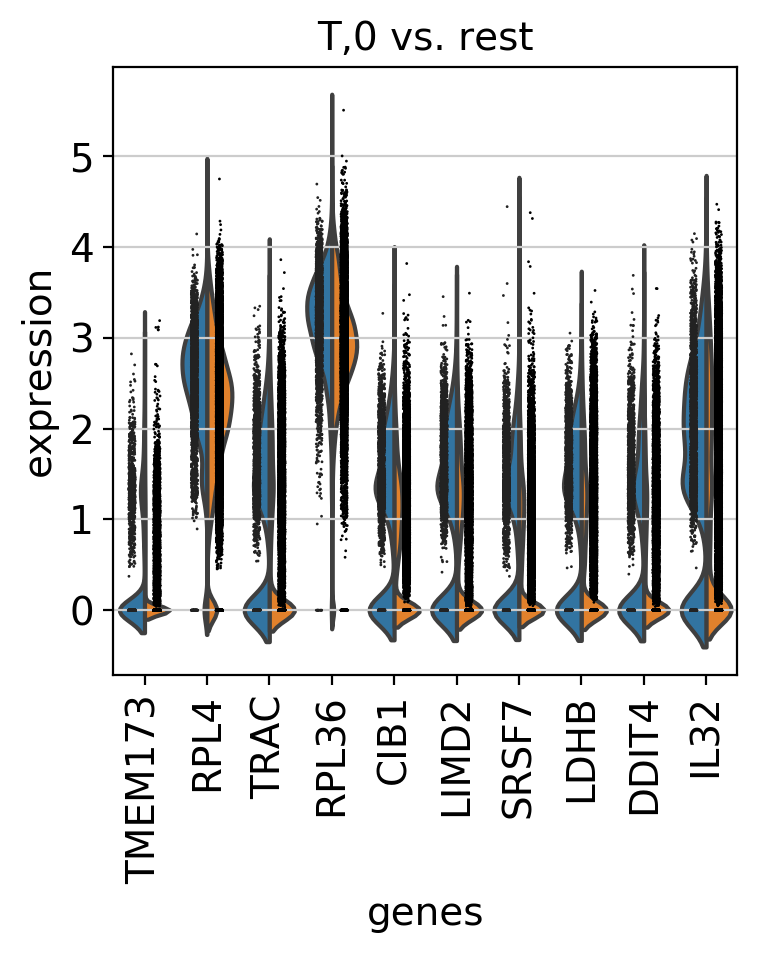

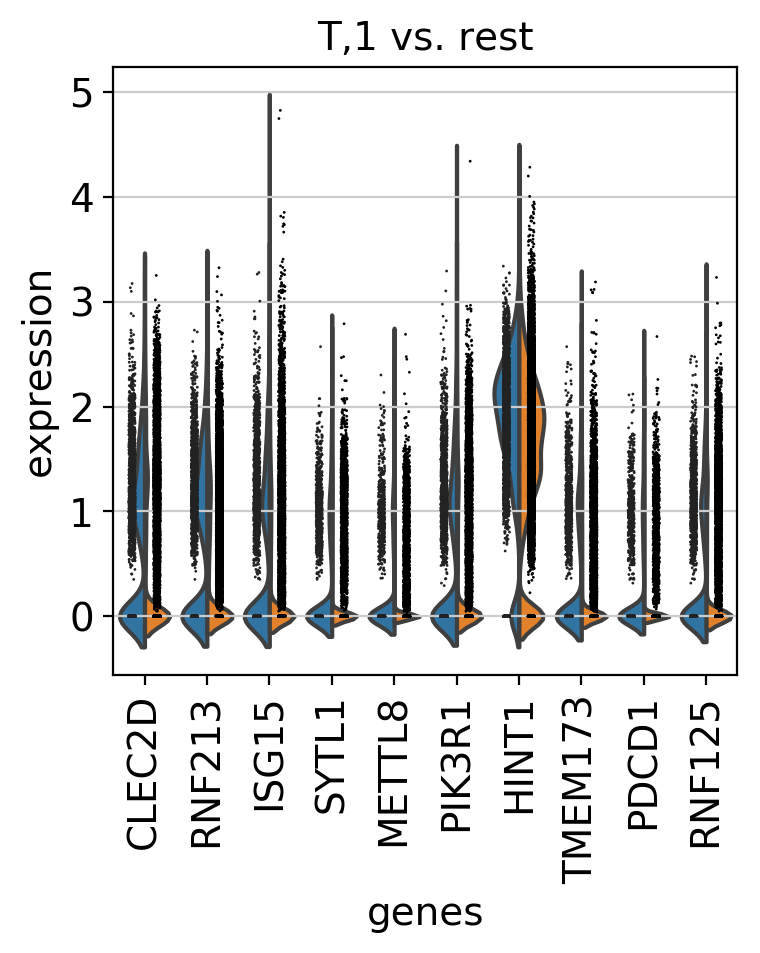

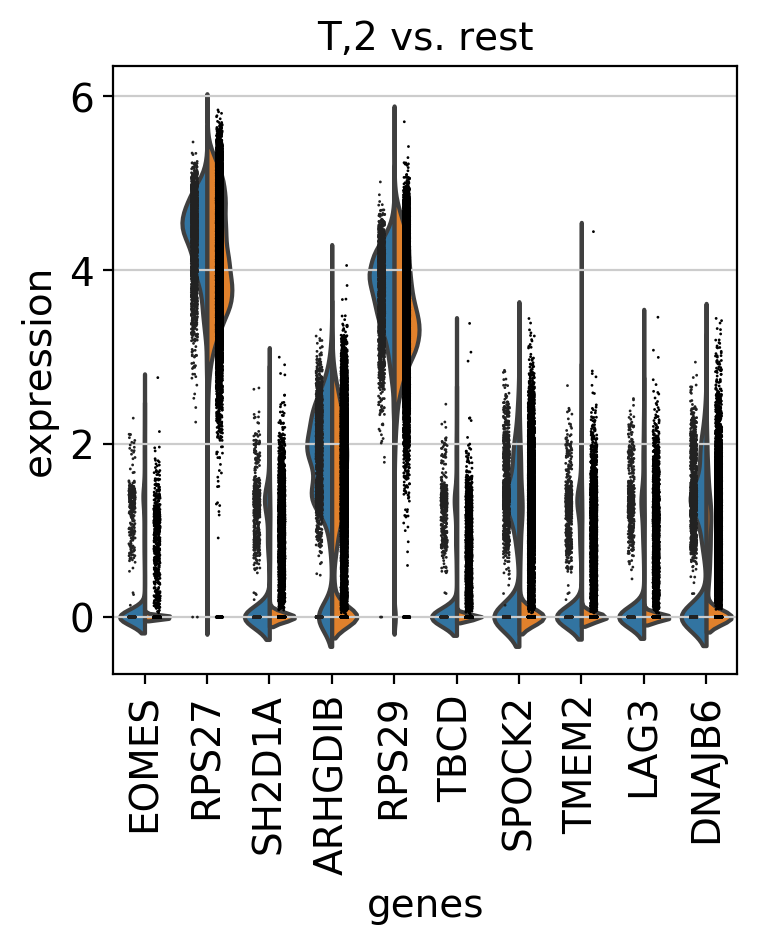

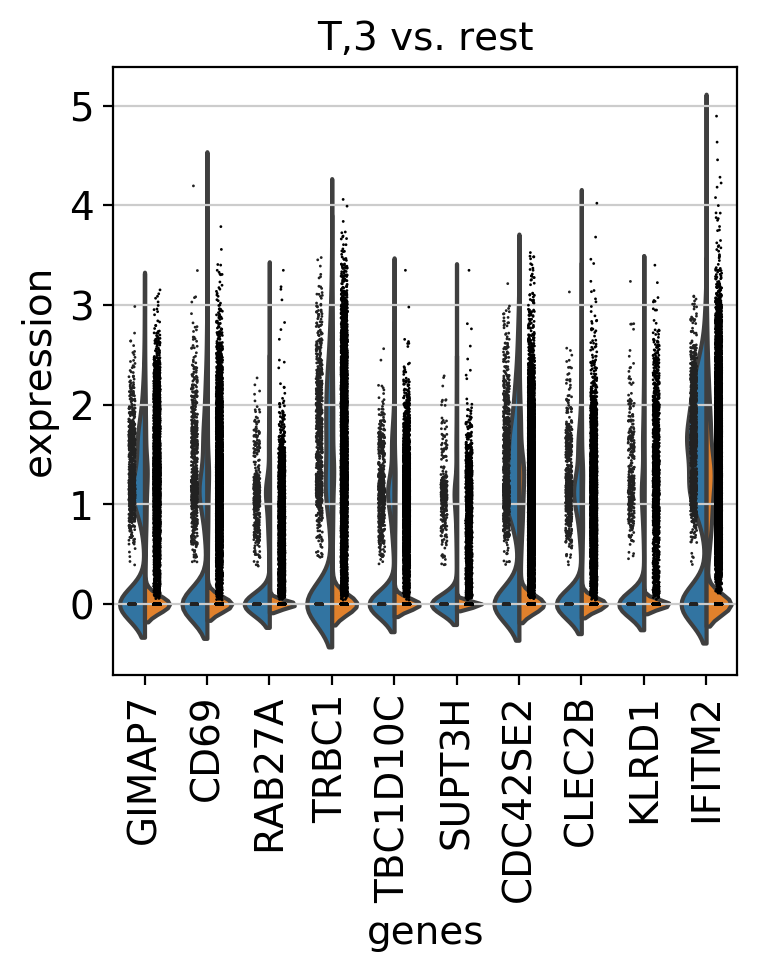

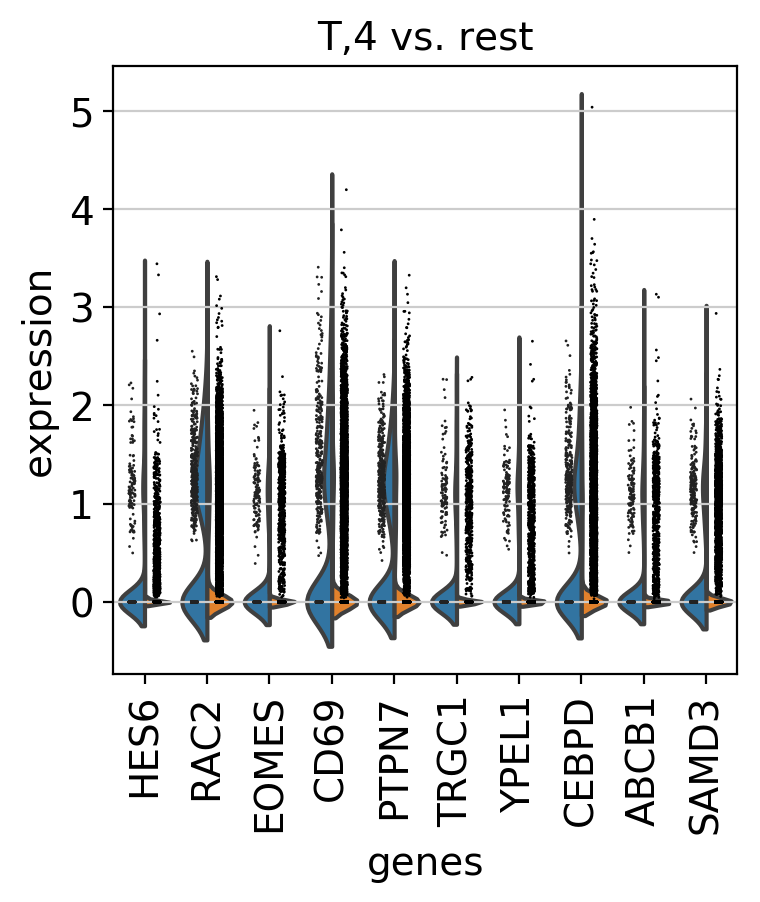

In [43]:
T_clusts = [clust for clust in adata.obs['louvain_T_sub'].cat.categories if clust.startswith('T')]

for clust in T_clusts:
    sc.pl.rank_genes_groups_violin(adata, use_raw=True, key='rank_genes_T_sub', 
                                   groups=[clust], 
                                   gene_names=adata.uns['rank_genes_T_sub']['names'][clust][90:100])

In [44]:
marker_genes_T = {"T-cells":["CD3D","CD3E","NKG7","IL23R","NFAT5",
                             "SGK1","HIF1A","IFNG","IL6","IL10", "CD4","TBX21","GATA3","RORC"]} 
                #"TNFA", "IL17A","IL17F","IL21","IL22","FOXP3"
#marker_genes_dict_T = {k: marker_genes_dict[k] for k in marker_genes_dict if k.startswith('T')}

#Find marker overlap
sc.tl.marker_gene_overlap(adata, marker_genes_T, key='rank_genes_T_sub', normalize='reference')

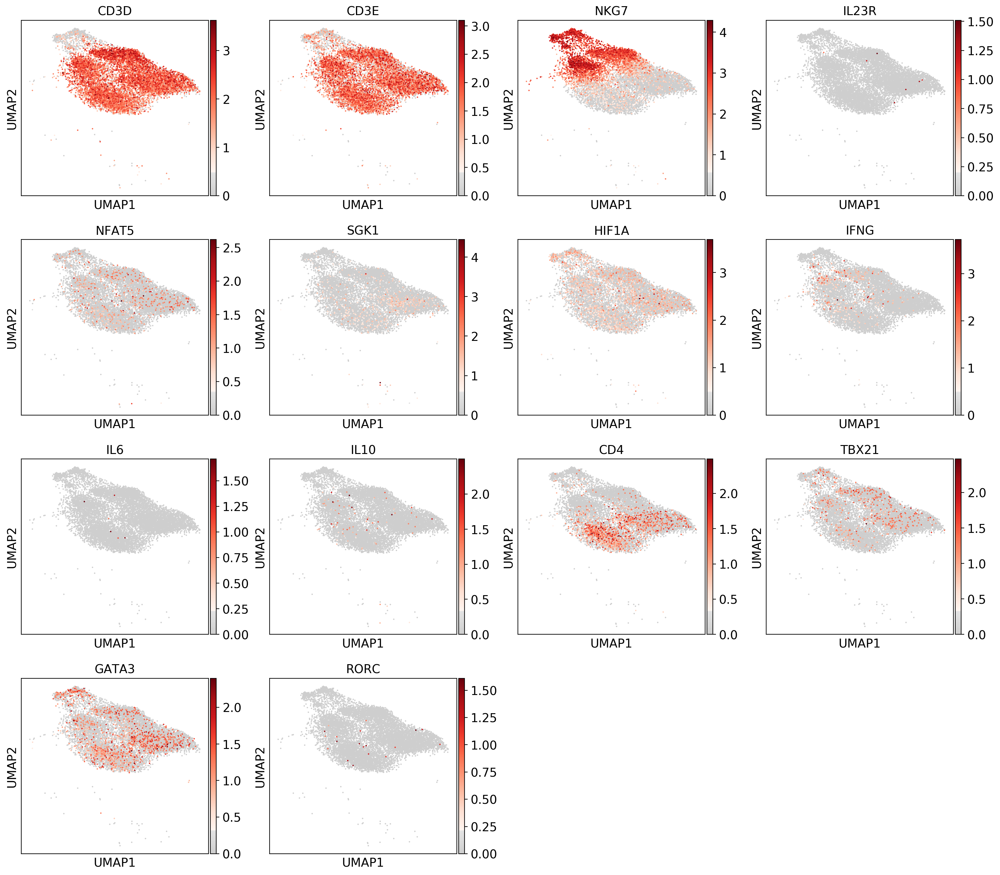

In [45]:
sc.pl.umap(adata[adata.obs["new_clusters"]=="T"], color=marker_genes_T["T-cells"],
           title=marker_genes_T["T-cells"], color_map=mymap)
#sc.pl.umap(adata[adata.obs["new_clusters"]=="T"], color='louvain_T_sub')

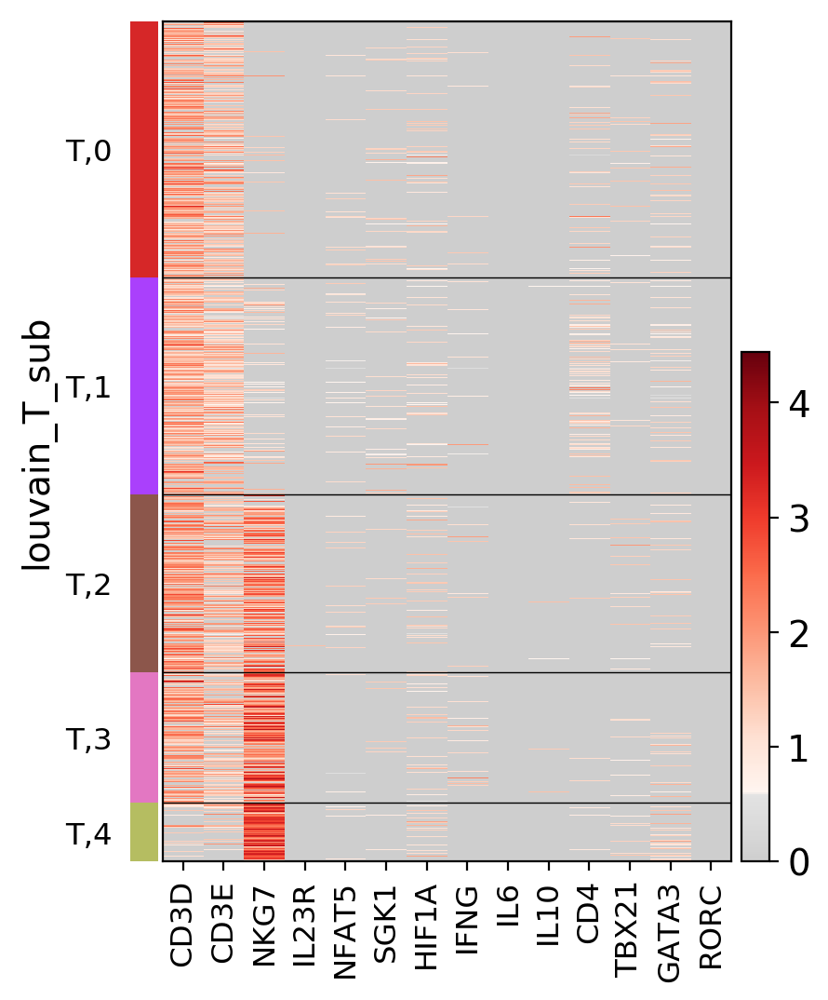

In [46]:
ax = sc.pl.heatmap(adata[adata.obs["new_clusters"]=="T"], marker_genes_T["T-cells"], groupby="louvain_T_sub", 
                   show_gene_labels=True, cmap=mymap)     

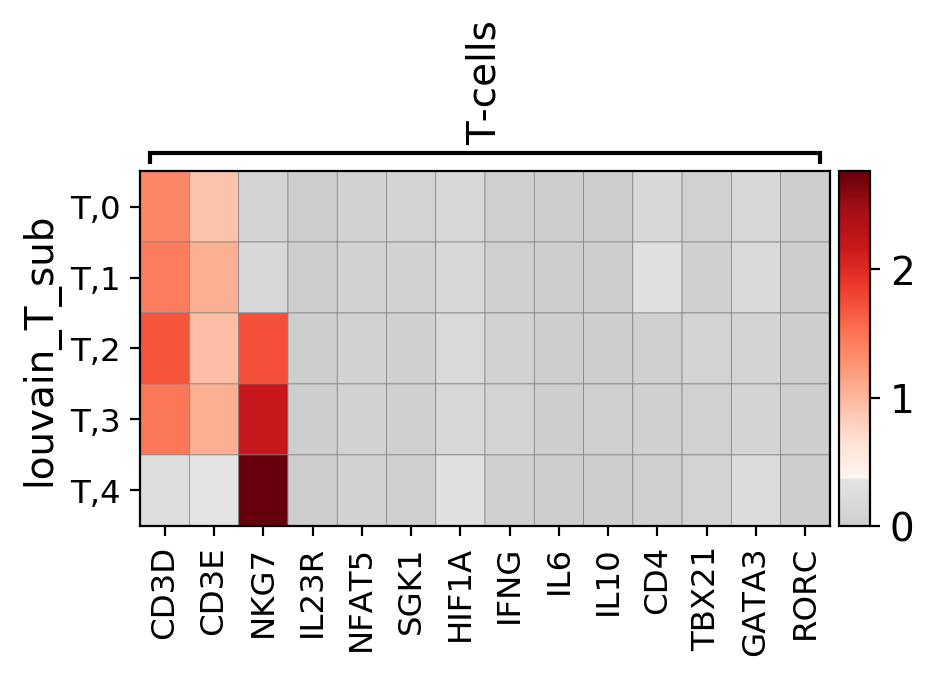

GridSpec(2, 3, height_ratios=[0.5, 10], width_ratios=[4.48, 0, 0.2])

In [47]:
#Matrixplot
sc.pl.matrixplot(adata[adata.obs["new_clusters"]=="T"], marker_genes_T, groupby='louvain_T_sub', cmap=mymap)

In [48]:
import matplotlib.pyplot as plt
print("#T-Cells: ", len(adata[adata.obs["new_clusters"]=="T"]))
# use raw data _> only normlaized and log tranformed: zero vlaue is still zero!
for m in marker_genes_T["T-cells"]:
    number = sum(adata[adata.obs["new_clusters"]=="T"].raw[: , m].X > 0)
    print("#",m, " expressing cells: ",number, " (",round(number/len(adata[adata.obs["new_clusters"]=="T"])*100, 2),"%)", sep='')

#T-Cells:  11251
#CD3D expressing cells: 8788 (78.11%)
#CD3E expressing cells: 7185 (63.86%)
#NKG7 expressing cells: 5005 (44.48%)
#IL23R expressing cells: 7 (0.06%)
#NFAT5 expressing cells: 629 (5.59%)
#SGK1 expressing cells: 574 (5.1%)
#HIF1A expressing cells: 1632 (14.51%)
#IFNG expressing cells: 434 (3.86%)
#IL6 expressing cells: 6 (0.05%)
#IL10 expressing cells: 79 (0.7%)
#CD4 expressing cells: 1443 (12.83%)
#TBX21 expressing cells: 543 (4.83%)
#GATA3 expressing cells: 1481 (13.16%)
#RORC expressing cells: 19 (0.17%)


In [49]:
import matplotlib.pyplot as plt
nr_batch=len(np.unique(adata.obs["batch"]))
print("normalized for number of samples:")
print("#T-Cells: ", len(adata[adata.obs["new_clusters"]=="T"])/nr_batch)
# use raw data _> only normlaized and log tranformed: zero vlaue is still zero!
for m in marker_genes_T["T-cells"]:
    number = sum(adata[adata.obs["new_clusters"]=="T"].raw[: , m].X > 0)/nr_batch
    print("#",m, " expressing cells: ",number,
          " (",round(number/(len(adata[adata.obs["new_clusters"]=="T"])/nr_batch)*100, 2),"%)", sep='')

normalized for number of samples:
#T-Cells:  2812.75
#CD3D expressing cells: 2197.0 (78.11%)
#CD3E expressing cells: 1796.25 (63.86%)
#NKG7 expressing cells: 1251.25 (44.48%)
#IL23R expressing cells: 1.75 (0.06%)
#NFAT5 expressing cells: 157.25 (5.59%)
#SGK1 expressing cells: 143.5 (5.1%)
#HIF1A expressing cells: 408.0 (14.51%)
#IFNG expressing cells: 108.5 (3.86%)
#IL6 expressing cells: 1.5 (0.05%)
#IL10 expressing cells: 19.75 (0.7%)
#CD4 expressing cells: 360.75 (12.83%)
#TBX21 expressing cells: 135.75 (4.83%)
#GATA3 expressing cells: 370.25 (13.16%)
#RORC expressing cells: 4.75 (0.17%)


In [70]:
import matplotlib.pyplot as plt
# use raw data _> only normlaized and log tranformed: zero vlaue is still zero!
for m in ["NFAT5","SGK1","HIF1A"]:
    print(m)
    l = list(adata[adata.obs["new_clusters"]=="T"].raw[: , m].X) 
    l = list(filter(lambda num: num != 0, l))
    arr = np.array(l)
    print("Mean: ",np.mean(arr, axis=0))
    print("Std: ",np.std(arr, axis=0))

NFAT5
Mean:  1.1044503886142807
Std:  0.3281415748172209
SGK1
Mean:  1.1449445691020228
Std:  0.3955086490546485
HIF1A
Mean:  1.1492346939813676
Std:  0.3480032390142462


In [50]:
print("#T-Cells: ", np.unique(adata[adata.obs["new_clusters"]=="T"].obs["batch"], return_counts=True))
for b in np.unique(adata.obs["batch"]):
    print(b)
    for m in marker_genes_T["T-cells"]:
        number = sum(adata[(adata.obs["new_clusters"]=="T") & (adata.obs["batch"]==b)].raw[: , m].X > 0)
        print("#",m, " expressing cells: ",number,
              " (",round(number/(len(adata[(adata.obs["new_clusters"]=="T") & (adata.obs["batch"]==b)]))*100, 2),"%)", sep='')

#T-Cells:  (array(['batch_0', 'batch_1', 'batch_2', 'batch_3'], dtype=object), array([ 944, 5947,  475, 3885]))
batch_0
#CD3D expressing cells: 554 (58.69%)
#CD3E expressing cells: 391 (41.42%)
#NKG7 expressing cells: 339 (35.91%)
#IL23R expressing cells: 0 (0.0%)
#NFAT5 expressing cells: 34 (3.6%)
#SGK1 expressing cells: 53 (5.61%)
#HIF1A expressing cells: 79 (8.37%)
#IFNG expressing cells: 12 (1.27%)
#IL6 expressing cells: 3 (0.32%)
#IL10 expressing cells: 3 (0.32%)
#CD4 expressing cells: 44 (4.66%)
#TBX21 expressing cells: 21 (2.22%)
#GATA3 expressing cells: 58 (6.14%)
#RORC expressing cells: 7 (0.74%)
batch_1
#CD3D expressing cells: 4590 (77.18%)
#CD3E expressing cells: 3481 (58.53%)
#NKG7 expressing cells: 2502 (42.07%)
#IL23R expressing cells: 4 (0.07%)
#NFAT5 expressing cells: 298 (5.01%)
#SGK1 expressing cells: 284 (4.78%)
#HIF1A expressing cells: 815 (13.7%)
#IFNG expressing cells: 171 (2.88%)
#IL6 expressing cells: 2 (0.03%)
#IL10 expressing cells: 18 (0.3%)
#CD4 expressing c

-> subclusters not really reliable since so few cells... 

### CD4 positive Cells Subclustering

In [51]:
adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)]

View of AnnData object with n_obs × n_vars = 1443 × 21841 
    obs: 'batch', 'sample', 'n_counts', 'percent_mito', 'n_genes', 'size_factors', 'louvain', 'new_clusters', 'louvain_T_sub'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'batch_colors', 'louvain', 'louvain_colors', 'rank_genes_groups', 'new_clusters_colors', 'louvain_T_sub_colors', 'rank_genes_T_sub'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

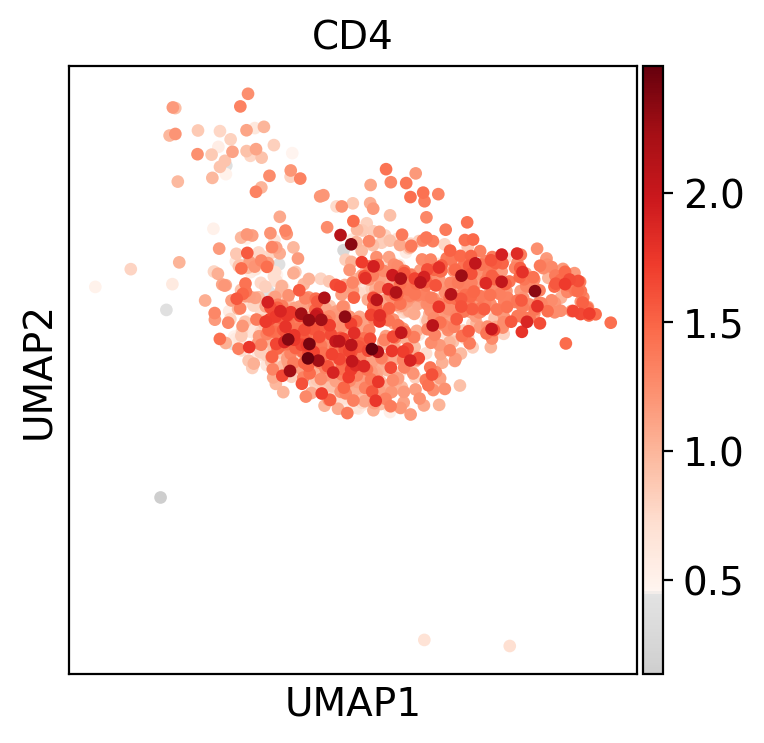

In [52]:
sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)],
                 color="CD4", color_map=mymap)
#sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)], color='louvain_T_sub', color_map=mymap)

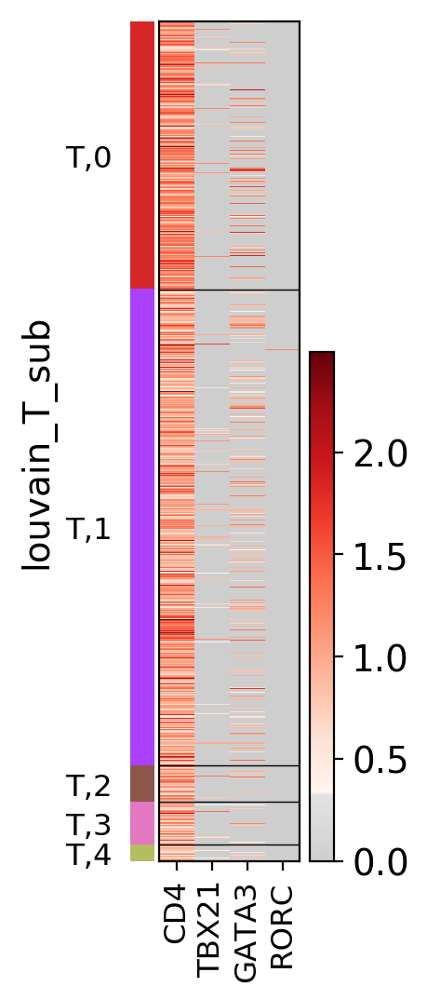

In [53]:
marker_genes_T4 = ["CD4","TBX21","GATA3","RORC"] #"CD3D","CD3E","NKG7","FOXP3",
ax = sc.pl.heatmap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)], 
                   marker_genes_T4, groupby="louvain_T_sub", show_gene_labels=True, cmap=mymap)     

#Matrixplot
sc.pl.matrixplot(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)], 
                 marker_genes_T4, groupby='louvain_T_sub')

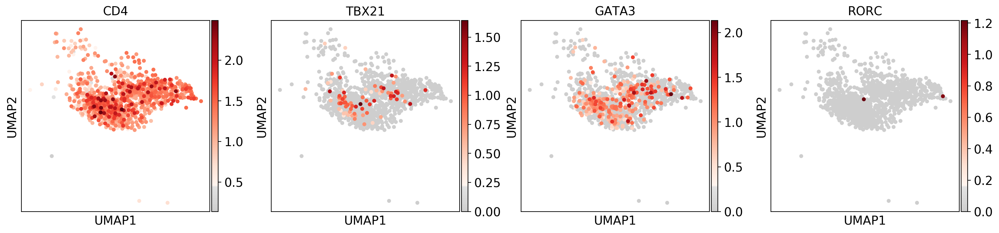

In [54]:
sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"CD4"].X > 0)], 
           color=marker_genes_T4,  color_map=mymap)

### RORC postivie Cells

In [55]:
adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"RORC"].X > 0)]

View of AnnData object with n_obs × n_vars = 19 × 21841 
    obs: 'batch', 'sample', 'n_counts', 'percent_mito', 'n_genes', 'size_factors', 'louvain', 'new_clusters', 'louvain_T_sub'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'batch_colors', 'louvain', 'louvain_colors', 'rank_genes_groups', 'new_clusters_colors', 'louvain_T_sub_colors', 'rank_genes_T_sub'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"RORC"].X > 0)], 
                 color="CD4", color_map=mymap)
#sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"RORC"].X > 0)],color='louvain_T_sub', color_map=mymap)

marker_genes_TR = ["RORC","IL17RA","NFAT5","SGK1",'SLC6A9','SLC6A17', 'SLC6A11', 'SLC6A6', 'SLC6A20',
                   'SLC6A3', 'SLC6A7', 'SLC6A8', 'SLC6A12', 'SLC6A13', 'SLC6A4', 'SLC6A16',"HIF1A",]
ax = sc.pl.heatmap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"RORC"].X > 0)], 
                   marker_genes_TR, groupby="louvain", show_gene_labels=True, figsize =(8,12), 
                  cmap=mymap)     

sc.pl.umap(adata[(adata.obs["new_clusters"]=="T") & (adata.raw[:,"RORC"].X > 0)],
           color=marker_genes_TR, color_map=mymap)

## Mesothelial Cells

In [56]:
sc.tl.louvain(adata, restrict_to=('new_clusters', ['Meso']), resolution=0.4,
              key_added='louvain_Meso_sub')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00)


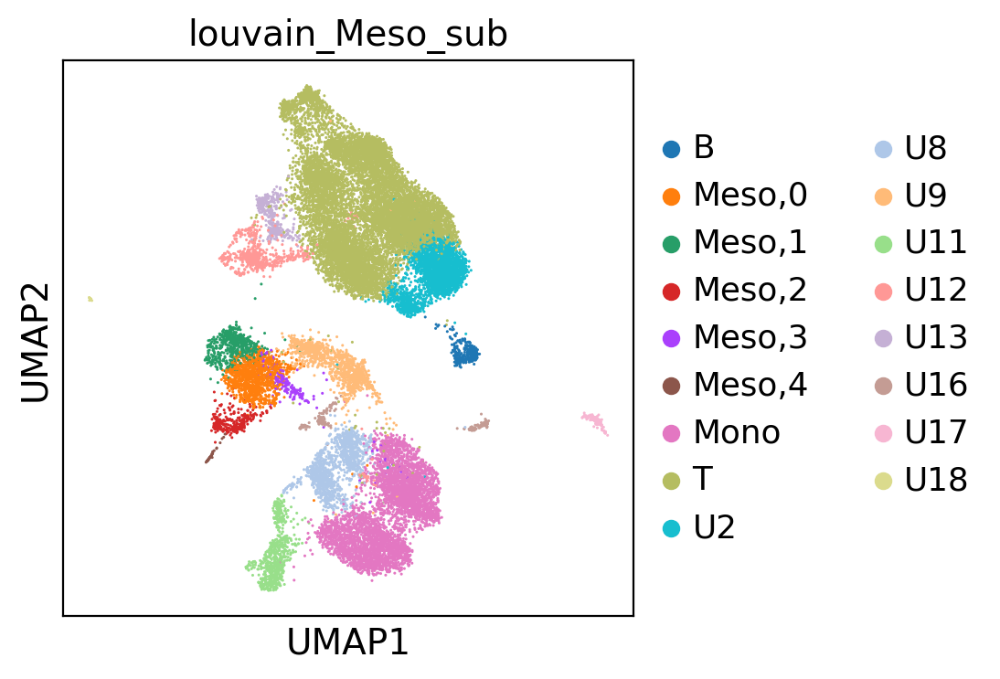

In [57]:
#Show the new clustering:
if 'louvain_Meso_sub_colors' in adata.uns:
    del adata.uns['louvain_Meso_sub_colors']

sc.pl.umap(adata, color='louvain_Meso_sub')

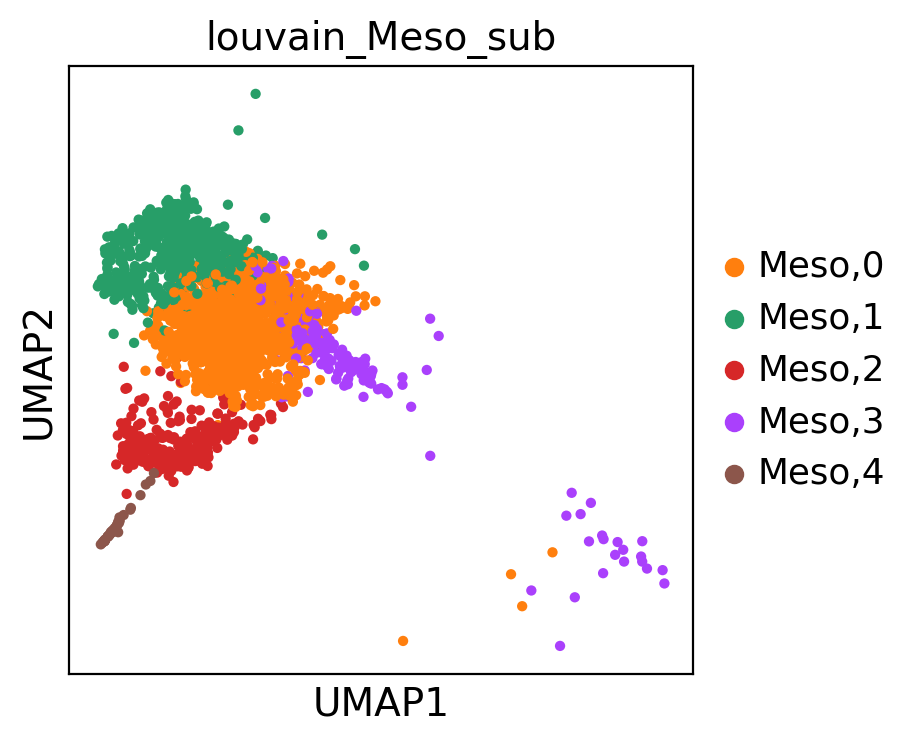

In [58]:
sc.pl.umap(adata[adata.obs["new_clusters"]=="Meso"], color='louvain_Meso_sub')

In [59]:
#Get the new marker genes
sc.tl.rank_genes_groups(adata, groupby='louvain_Meso_sub', key_added='rank_genes_Meso_sub')

ranking genes
    finished (0:00:35)


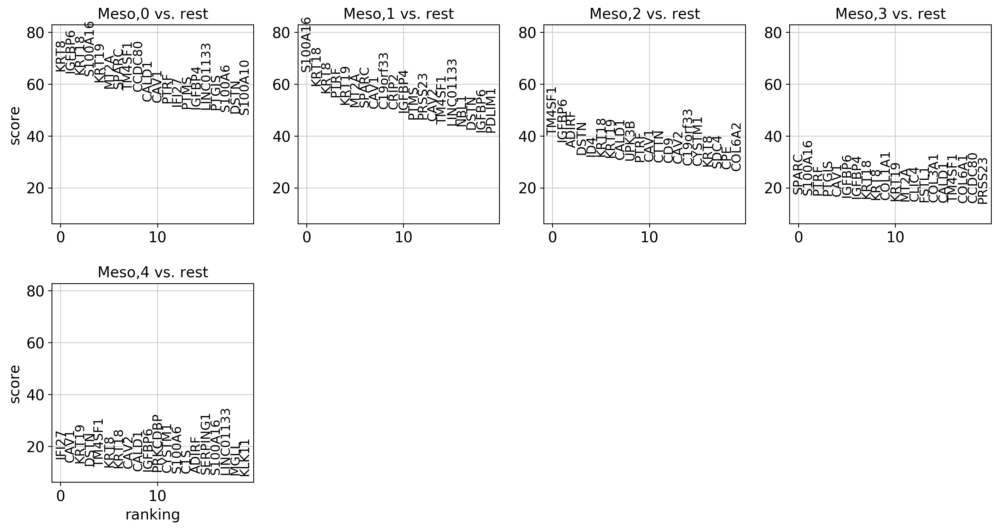

In [60]:
#Plot the new marker genes
Meso_clusters = [i for i in np.unique(adata.obs["louvain_Meso_sub"]) if "Meso" in i] 
sc.pl.rank_genes_groups(adata, key='rank_genes_Meso_sub', groups=Meso_clusters, fontsize=12)

**test if subclusters are based on real differences or only noise**:  
plot rank_genes 90-100

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


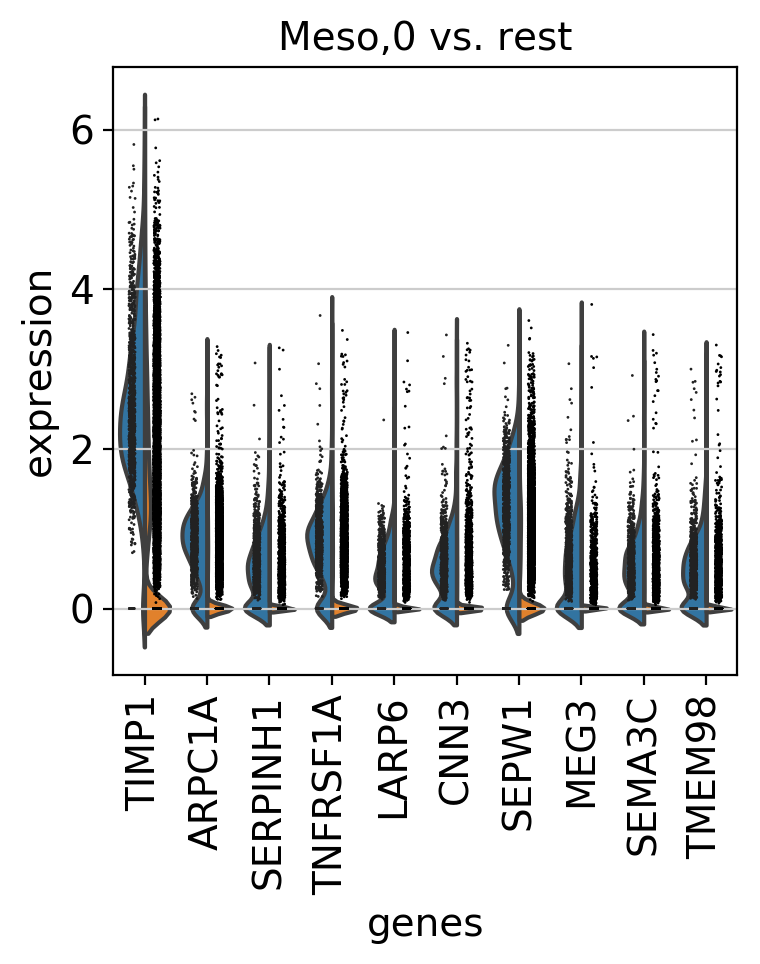

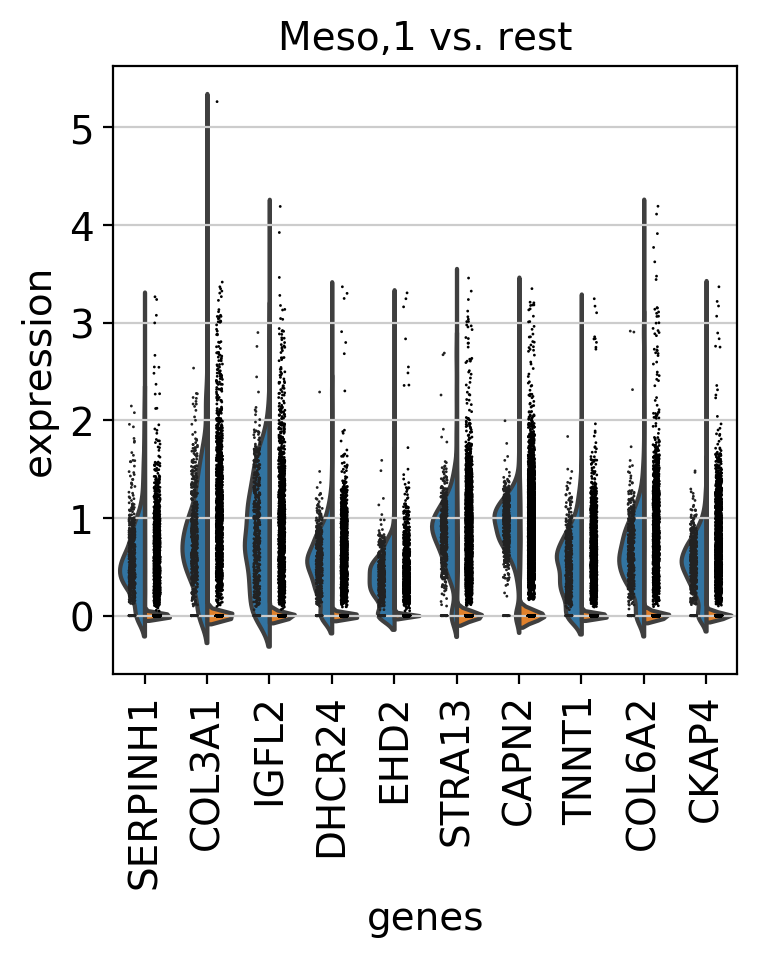

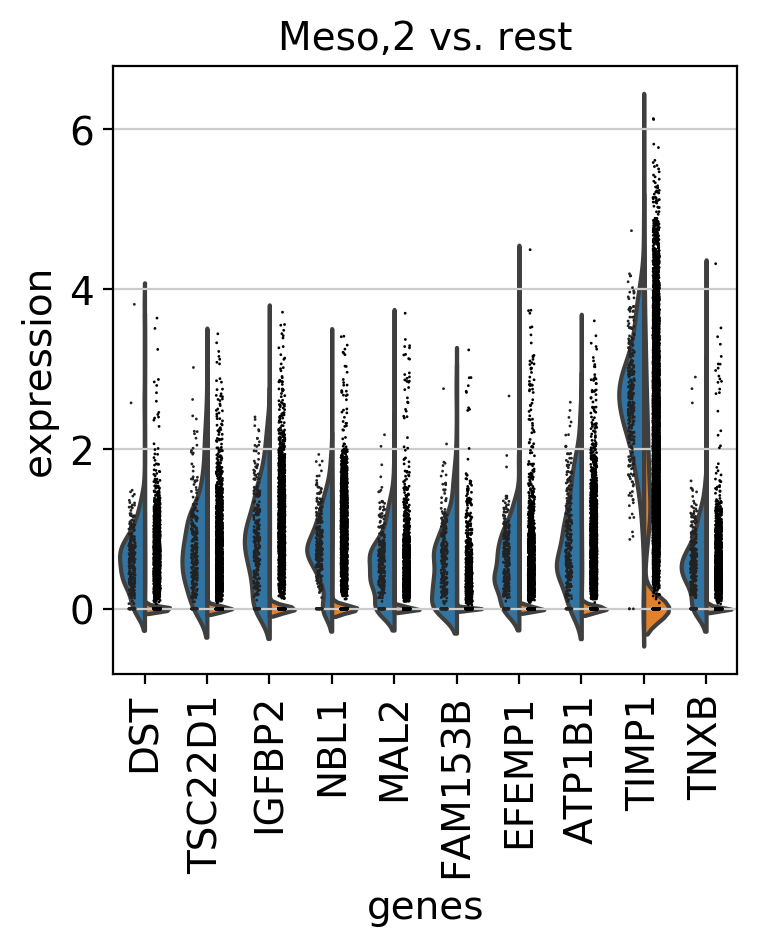

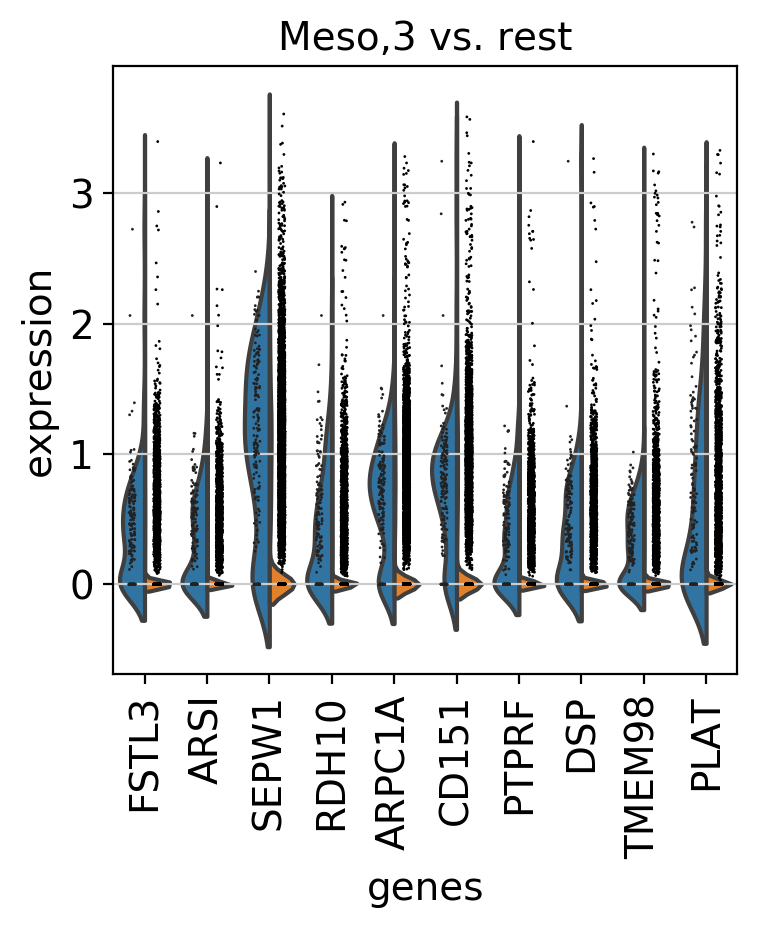

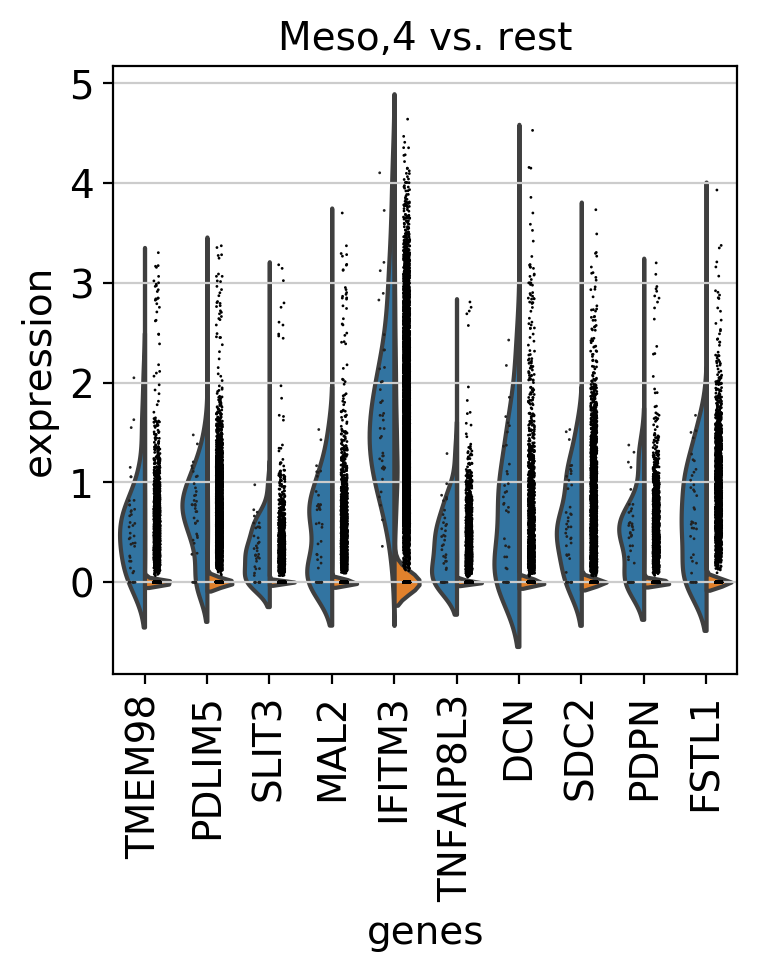

In [61]:
Meso_clusts = [clust for clust in adata.obs['louvain_Meso_sub'].cat.categories if clust.startswith('Meso')]

for clust in Meso_clusts:
    sc.pl.rank_genes_groups_violin(adata, use_raw=True, key='rank_genes_Meso_sub', 
                                   groups=[clust], 
                                   gene_names=adata.uns['rank_genes_Meso_sub']['names'][clust][90:100])

In [62]:
marker_genes_Meso = {"Meso-cells":["KRT5","UPK3B","PDPN","CX3CR1", "CX3CL1", "CCL2","IL6" ]} 

#Find marker overlap
sc.tl.marker_gene_overlap(adata, marker_genes_T, key='rank_genes_T_sub', normalize='reference')

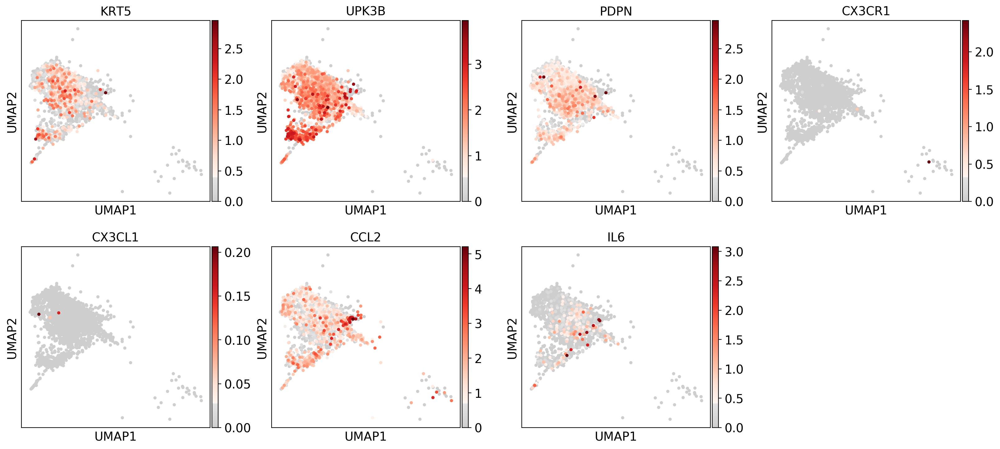

In [63]:
sc.pl.umap(adata[adata.obs["new_clusters"]=="Meso"], color=marker_genes_Meso["Meso-cells"],
           title=marker_genes_Meso["Meso-cells"], color_map=mymap)
#sc.pl.umap(adata[adata.obs["new_clusters"]=="T"], color='louvain_T_sub')

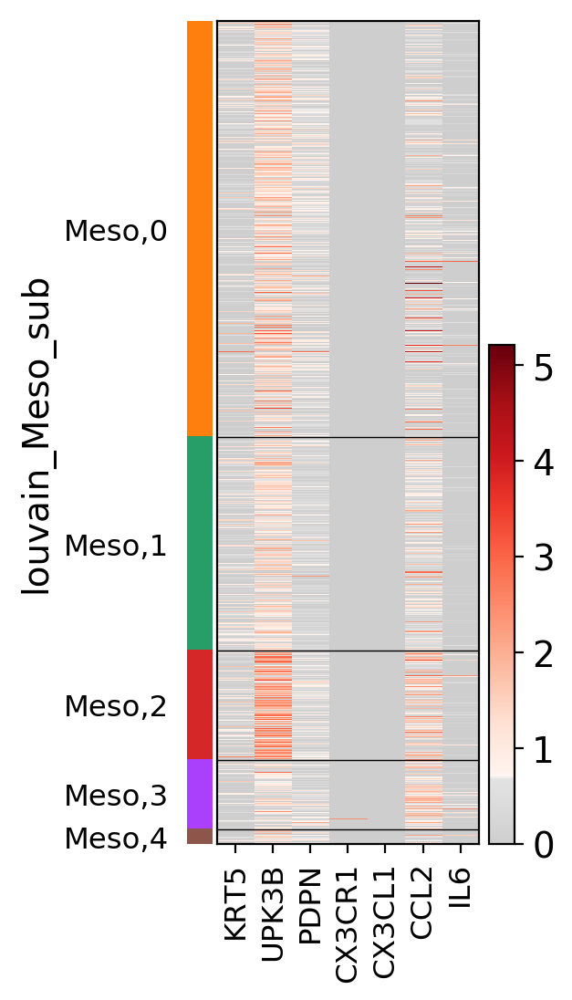

In [64]:
ax = sc.pl.heatmap(adata[adata.obs["new_clusters"]=="Meso"], marker_genes_Meso["Meso-cells"],
                   groupby="louvain_Meso_sub", show_gene_labels=True, cmap=mymap)     

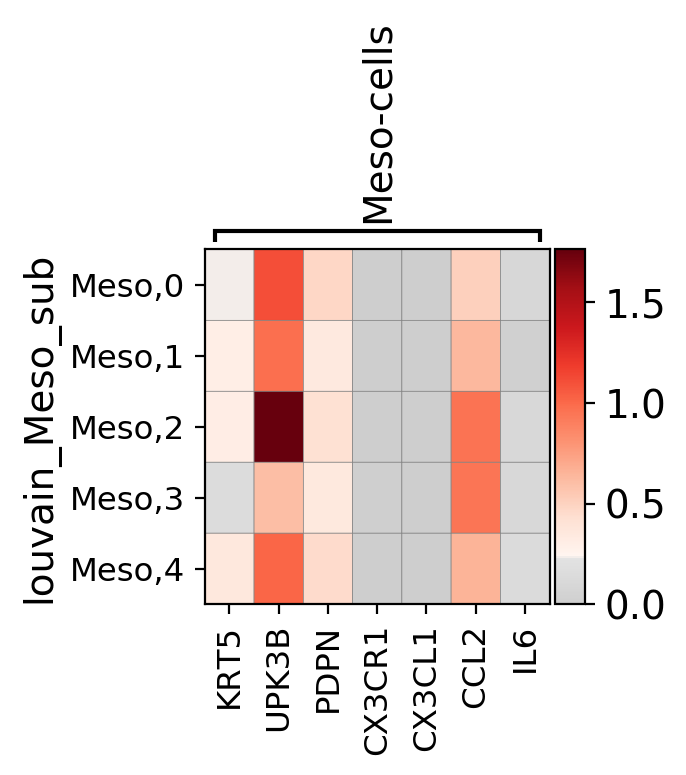

GridSpec(2, 3, height_ratios=[0.5, 10], width_ratios=[2.24, 0, 0.2])

In [65]:
#Matrixplot
sc.pl.matrixplot(adata[adata.obs["new_clusters"]=="Meso"], marker_genes_Meso,
                 groupby='louvain_Meso_sub', cmap=mymap)

In [66]:
import matplotlib.pyplot as plt
print("#Meso-Cells: ", len(adata[adata.obs["new_clusters"]=="Meso"]))
# use raw data _> only normlaized and log tranformed: zero vlaue is still zero!
for m in marker_genes_Meso["Meso-cells"]:
    number = sum(adata[adata.obs["new_clusters"]=="Meso"].raw[: , m].X > 0)
    print("#",m, " expressing cells: ",number,
          " (",round(number/len(adata[adata.obs["new_clusters"]=="Meso"])*100, 2),"%)", sep='')

#Meso-Cells:  2182
#KRT5 expressing cells: 989 (45.33%)
#UPK3B expressing cells: 1883 (86.3%)
#PDPN expressing cells: 1688 (77.36%)
#CX3CR1 expressing cells: 6 (0.27%)
#CX3CL1 expressing cells: 3 (0.14%)
#CCL2 expressing cells: 1616 (74.06%)
#IL6 expressing cells: 398 (18.24%)


In [67]:
import matplotlib.pyplot as plt
nr_batch=len(np.unique(adata.obs["batch"]))
print("normalized for number of samples:")
print("#Meso-Cells: ", len(adata[adata.obs["new_clusters"]=="Meso"])/nr_batch)
# use raw data _> only normlaized and log tranformed: zero vlaue is still zero!
for m in marker_genes_Meso["Meso-cells"]:
    number = sum(adata[adata.obs["new_clusters"]=="Meso"].raw[: , m].X > 0)/nr_batch
    print("#",m, " expressing cells: ",number,
          " (",round(number/(len(adata[adata.obs["new_clusters"]=="Meso"])/nr_batch)*100, 2),"%)", sep='')

normalized for number of samples:
#Meso-Cells:  545.5
#KRT5 expressing cells: 247.25 (45.33%)
#UPK3B expressing cells: 470.75 (86.3%)
#PDPN expressing cells: 422.0 (77.36%)
#CX3CR1 expressing cells: 1.5 (0.27%)
#CX3CL1 expressing cells: 0.75 (0.14%)
#CCL2 expressing cells: 404.0 (74.06%)
#IL6 expressing cells: 99.5 (18.24%)


In [68]:

print("#Meso-Cells: ", np.unique(adata[adata.obs["new_clusters"]=="Meso"].obs["batch"], return_counts=True))
for b in np.unique(adata.obs["batch"]):
    print(b)
    for m in marker_genes_Meso["Meso-cells"]:
        number = sum(adata[(adata.obs["new_clusters"]=="Meso") & (adata.obs["batch"]==b)].raw[: , m].X > 0)
        print("#",m, " expressing cells: ",number,
              " (",round(number/(len(adata[(adata.obs["new_clusters"]=="Meso") & (adata.obs["batch"]==b)]))*100, 2),"%)", sep='')

#Meso-Cells:  (array(['batch_0', 'batch_1', 'batch_2', 'batch_3'], dtype=object), array([ 444,   57, 1665,   16]))
batch_0
#KRT5 expressing cells: 151 (34.01%)
#UPK3B expressing cells: 314 (70.72%)
#PDPN expressing cells: 252 (56.76%)
#CX3CR1 expressing cells: 1 (0.23%)
#CX3CL1 expressing cells: 0 (0.0%)
#CCL2 expressing cells: 310 (69.82%)
#IL6 expressing cells: 74 (16.67%)
batch_1
#KRT5 expressing cells: 18 (31.58%)
#UPK3B expressing cells: 31 (54.39%)
#PDPN expressing cells: 27 (47.37%)
#CX3CR1 expressing cells: 0 (0.0%)
#CX3CL1 expressing cells: 0 (0.0%)
#CCL2 expressing cells: 27 (47.37%)
#IL6 expressing cells: 6 (10.53%)
batch_2
#KRT5 expressing cells: 817 (49.07%)
#UPK3B expressing cells: 1534 (92.13%)
#PDPN expressing cells: 1405 (84.38%)
#CX3CR1 expressing cells: 5 (0.3%)
#CX3CL1 expressing cells: 3 (0.18%)
#CCL2 expressing cells: 1268 (76.16%)
#IL6 expressing cells: 317 (19.04%)
batch_3
#KRT5 expressing cells: 3 (18.75%)
#UPK3B expressing cells: 4 (25.0%)
#PDPN expressing cel

In [69]:
adata.write(results_file)
#adata = sc.read(results_file)

In [1]:
import scanpy as sc
adata = sc.read(data_path+'/GSE130888_RAW/LPD/results_2.h5ad' )
adata

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA_2022/lib/python3.9/site-packages/anndata/compat/__init__.py:229: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(
/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA_2022/lib/python3.9/site-packages/anndata/compat/__init__.py:229: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  warn(


AnnData object with n_obs × n_vars = 24847 × 21841
    obs: 'batch', 'sample', 'n_counts', 'percent_mito', 'n_genes', 'size_factors', 'louvain', 'new_clusters', 'louvain_T_sub', 'louvain_Meso_sub'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'louvain', 'louvain_Meso_sub_colors', 'louvain_T_sub_colors', 'louvain_colors', 'neighbors', 'new_clusters_colors', 'pca', 'rank_genes_Meso_sub', 'rank_genes_T_sub', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [2]:
genes = ["NINJ1","CASP1", "CASP3", "CASP8", 'PADI2', 'PADI1', 'PADI4', "IL1B", "IL18", "ZBP1", "CCL2", "TNF", "IL6"] #"PAD4","PAD1", "PADI3","P53",

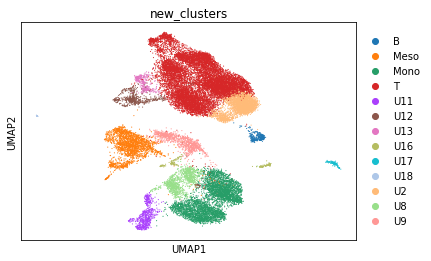

In [6]:
sc.pl.umap(adata, color="new_clusters", ncols=2)

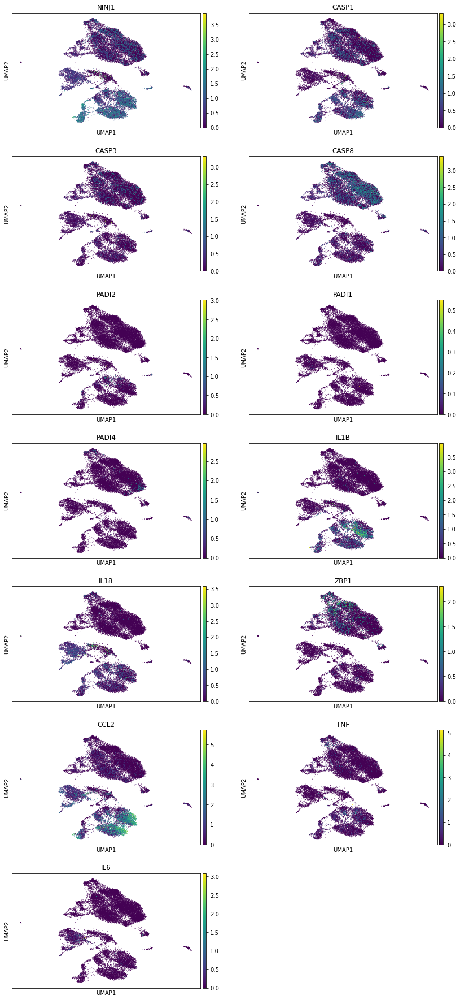

In [3]:
sc.pl.umap(adata, color=genes, ncols=2)

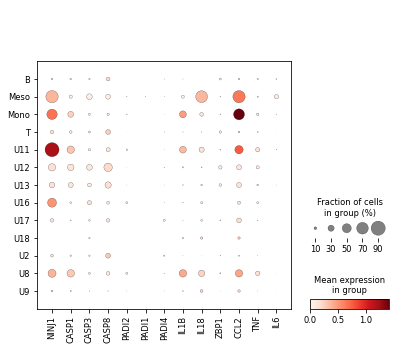

In [4]:
sc.pl.dotplot(adata, var_names=genes, groupby="new_clusters")